## Proyecto EDA - Accidentalidad de Madrid

Este EDA va sobre la accidental de la cuidad de Madrid en los años 2020, 2021, 2022, 2023, 2024 y 2025. Los Dataset han diso descargados de la web....

- Librerias importantes que necesitamos en el EDA:

In [1]:
import pandas as pd
import os
import glob
import numpy as np
pd.options.mode.copy_on_write=True

- Primero vamos hacer una exploracion de las varibales que tenemos.

- Explorando el Dataset nos damos cuenta que hay varios numeros de expedientes iguales y la conclusion es que hay un num expediente por persona implicada en el accidente y es importante entender esto porque puede afectar al calculo de numero de accidentes, ademas que si hay varias personas implicadas en el acidente puede ser que haya personas que salgan leves, graves,etc

Objetivos del EDA:

1. EDA Temporal
Columnas útiles: fecha, hora
Qué puedes analizar
- Distribución de accidentes por día, mes, día de la semana
- Accidentes por franja horaria
- Identificar horas pico
- Accidentes en madrugada vs tarde vs noche
- Evolución diaria (si tienes varios meses)
Preguntas guía
- ¿A qué horas ocurren más accidentes?
- ¿Hay patrones nocturnos asociados a alcohol/drogas?
- ¿Hay días con más siniestros?
2. EDA Geográfico
Columnas: coordenada_x_utm, coordenada_y_utm, distrito, cod_distrito, localizacion
Qué puedes analizar
- Mapa de calor de accidentes (heatmap)
- Accidentes por distrito
- Puntos negros (localizaciones repetidas)
- Comparación entre distritos
Preguntas guía
- ¿Qué distritos concentran más accidentes?
- ¿Qué intersecciones aparecen repetidas?
3. EDA por Tipo de Accidente
Columnas: tipo_accidente, estado_meteorológico
Qué puedes analizar
- Frecuencia de cada tipo de accidente
- Relación entre clima y tipo de accidente
- Accidentes en días despejados vs lluvia
Preguntas guía
- ¿Qué tipo de accidente es más común?
- ¿Influye el clima en la severidad?
4. EDA por Vehículos y Personas
Columnas: tipo_vehiculo, tipo_persona, rango_edad, sexo
Qué puedes analizar
- Vehículos más involucrados
- Distribución por edad
- Distribución por sexo
- Conductores vs pasajeros vs peatones
- Accidentes de motos vs coches
Preguntas guía
- ¿Qué vehículos tienen más siniestros?
- ¿Qué grupos de edad aparecen más?
- ¿Hay diferencias entre hombres y mujeres?
5. EDA de Lesividad (muy importante)
Columnas: cod_lesividad, lesividad
Qué puedes analizar
- Severidad de los accidentes
- Relación entre tipo de accidente y lesividad
- Relación entre tipo de vehículo y lesividad
- Lesividad por edad y sexo
Preguntas guía
- ¿Qué tipo de accidente genera más heridos graves?
- ¿Qué edades presentan mayor lesividad?
6. EDA de Alcohol y Drogas
Columnas: positiva_alcohol, positiva_droga
Qué puedes analizar
- Accidentes con alcohol
- Accidentes con drogas
- Relación con hora del día
- Relación con tipo de accidente
- Relación con edad
Preguntas guía
- ¿A qué horas aparecen más positivos?
- ¿Qué tipo de accidente está más asociado a alcohol?
7. EDA de Duplicados por Expediente
Columna: num_expediente
Cada expediente puede tener varias filas (una por persona implicada).
Qué puedes analizar
- Número de personas por accidente
- Accidentes con múltiples implicados
- Relación entre número de implicados y severidad
8. EDA de Calidad del Dato
Columnas con NaN: cod_lesividad, lesividad, positiva_droga
Qué puedes analizar
- Porcentaje de valores faltantes
- Patrones de ausencia (¿ciertos distritos reportan menos?)
- Limpieza necesaria para análisis posteriores
9. EDA Avanzado (si quieres ir más lejos)
- Clustering de puntos de accidente (KMeans)
- Detección de outliers espaciales
- Mapas interactivos con Folium
- Series temporales si tienes varios meses


## Exploracion Inicial

Este Dataset es administrativo no estadistico, lo cual quiere decir que cada columna tiene un significado legal o procedimental, aqui un nulo no es un error, sino un estado administrativo, no puedes inventar datos porque alteras la realidad del registro.



La exploracion incial sirve para entender la estructura del Dataset anes de analizar cada variable, aqui no se tranfroma nada solo se observa.

## 2024

- Primero cargamos el dataset de acccidentalidad de madrid del año 2025:

In [2]:
df_accidentes_2024 = pd.read_csv(
    "./data/2024_Accidentalidad.csv",
    sep=";",
    skip_blank_lines=True,
    on_bad_lines="skip",
    encoding="utf-8"
)



Ahora tambien quiero ver sus dimensiones, es decir cuantas filas y columnas tiene el Dataset

In [3]:
df_accidentes_2024.shape

(49340, 19)

- Aqui observamos que tenemos 19 columnas y 49340 filas.

Ahora para el formato real de los datos y detectar valores a simple vista

In [4]:
df_accidentes_2024.head()

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga
0,2023S040280,04/01/2024,14:09:00,AVDA. NICETO ALCALA ZAMORA / AUTOV. M-11,3,16,HORTALEZA,Colisión fronto-lateral,Lluvia débil,Motocicleta > 125cc,Conductor,De 55 a 59 años,Hombre,2.0,Ingreso inferior o igual a 24 horas,444913.0,4481427.0,N,NaN
1,2023S040280,04/01/2024,14:09:00,AVDA. NICETO ALCALA ZAMORA / AUTOV. M-11,3,16,HORTALEZA,Colisión fronto-lateral,Lluvia débil,Turismo,Conductor,De 55 a 59 años,Mujer,14.0,Sin asistencia sanitaria,444913.0,4481427.0,N,NaN
2,2023S040309,15/02/2024,14:05:00,CALL. TESORO / CALL. MINAS,18,1,CENTRO,Colisión fronto-lateral,Lluvia débil,Bicicleta,Conductor,De 25 a 29 años,Hombre,7.0,Asistencia sanitaria sólo en el lugar del acci...,440123.0,4475170.0,N,NaN
3,2023S040309,15/02/2024,14:05:00,CALL. TESORO / CALL. MINAS,18,1,CENTRO,Colisión fronto-lateral,Lluvia débil,Motocicleta hasta 125cc,Conductor,De 35 a 39 años,Hombre,14.0,Sin asistencia sanitaria,440123.0,4475170.0,N,NaN
4,2023S040310,18/02/2024,10:40:00,GTA. RUIZ JIMENEZ / CALL. SAN BERNARDO,3,7,CHAMBERÍ,Colisión lateral,Despejado,Turismo,Conductor,De 25 a 29 años,Hombre,NaN,NaN,440137.0,4475721.0,N,NaN


Ahora para saber si cada columna esta en el tipo correcto y dectar problemas como por ejemplo numeros como textos, fechas mal cargadas, booleanos como strings,etc.


In [5]:
df_accidentes_2024.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49340 entries, 0 to 49339
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   num_expediente        49340 non-null  object 
 1   fecha                 49340 non-null  object 
 2   hora                  49340 non-null  object 
 3   localizacion          49340 non-null  object 
 4   numero                49340 non-null  object 
 5   cod_distrito          49340 non-null  int64  
 6   distrito              49340 non-null  object 
 7   tipo_accidente        49335 non-null  object 
 8   estado_meteorológico  43424 non-null  object 
 9   tipo_vehiculo         48946 non-null  object 
 10  tipo_persona          49340 non-null  object 
 11  rango_edad            49340 non-null  object 
 12  sexo                  49340 non-null  object 
 13  cod_lesividad         27344 non-null  float64
 14  lesividad             27344 non-null  object 
 15  coordenada_x_utm   

Aqui procedemos hacer una copia del dataset para dejar el original tal cual y poder ver diferencias a la hora de limpiar y demas.

In [6]:
df_accidentes_2024_copy=df_accidentes_2024.copy()

Vamos a generar una tabla para ver los nulos y la cardinalidad de las diferentes variables que nos ayudaran a tomar decisiones con cada variable.
- La cardinalidad de las diferentes variables para decidir cuales son categoricas o no. Se calcula de la siguiente manera: 
$$Cardinalidad(<Columna/Característica>) = \dfrac{NúmerodeValoresUnicos(<Columna/Característica>)}{NúmeroTotalDeRegistros}* 100\%$$

In [7]:
# Número de nulos 
nulos = df_accidentes_2024_copy.isna().sum() 
# Porcentaje de nulos 
nulos_pct = (nulos / len(df_accidentes_2024_copy) * 100).round(2) 
# Cardinalidad 
card = df_accidentes_2024_copy.nunique() 
# Porcentaje de cardinalidad 
card_pct = (card / len(df_accidentes_2024_copy) * 100).round(2) 
# Tipo de dato 
tipos = df_accidentes_2024_copy.dtypes 
#Construcción de la tabla 
tabla_eda = pd.DataFrame({ 
    "nulos": nulos,
    "% nulos": nulos_pct,
    "cardinalidad": card, 
    "% cardinalidad": card_pct,
    "tipo": tipos }) 
# Ordenar por cardinalidad (o por nulos si prefieres) 
tabla_eda = tabla_eda.sort_values("cardinalidad", ascending=False) 
tabla_eda

,nulos,% nulos,cardinalidad,% cardinalidad,tipo
num_expediente,0,0.00,20698,41.95,object
localizacion,0,0.00,15131,30.67,object
coordenada_y_utm,6,0.01,10997,22.29,float64
coordenada_x_utm,6,0.01,10131,20.53,float64
numero,0,0.00,1759,3.57,object
hora,0,0.00,1256,2.55,object
fecha,0,0.00,366,0.74,object
tipo_vehiculo,394,0.80,32,0.06,object
cod_distrito,0,0.00,21,0.04,int64
distrito,0,0.00,21,0.04,object


-Calculo la caridnalidad de la varibale antes de tratar los nulos porque sino estaria alternando artificalmente la cardinalidad de las variables.

-A partir de aqui tomo decisiones para modificar las variables al tipo que creemos mas acertado.

| Variable          | Tipo original | Tipo final             | Descripción                        | Importancia | Notas | 
|-------------------|---------------|------------------------|------------------------------------|-------------|-------| 
|num_expediente     | object        | string                 | Identificador único del expediente | Baja        | Cardinalidad muy alta, no se analiza, solo ID. | 
|fecha | object | datetime | Fecha del accidente | Alta | Necesaria para análisis temporal. | 
| hora | object | datetime.time | Hora del accidente | Alta | Pandas no tiene dtype específico; se mantiene como time. | 
| fecha_hora | derivada | datetime | Combinación de fecha y hora | Alta | Útil para análisis temporal preciso. | 
| localizacion | object | string | Dirección o punto exacto del accidente | Media | Cardinalidad muy alta; no convertir a category. | 
| numero | object | string | Número de la vía | Baja | No es numérico real, parte de la dirección. | 
| cod_distrito | int64 | category | Código numérico del distrito | Media | Categórica nominal; cardinalidad baja. | 
| distrito | object | category | Nombre del distrito | Alta | Variable clave para análisis espacial. | 
| tipo_accidente | object | category | Tipo de accidente | Alta | Cardinalidad baja; categórica nominal. | 
| estado_meteorológico | object | category | Condición meteorológica | Media | Imputada con 'No consta', categórica nominal. | 
| tipo_vehiculo | object | category | Tipo de vehículo implicado | Alta | Cardinalidad media, categórica nominal. | 
| tipo_persona | object | category | Rol de la persona (conductor, peatón...) | Alta | Categórica nominal. | 
| rango_edad | object | category (ordinal) | Rango de edad | Alta | Tiene orden natural, convertir a ordinal. | 
| sexo | object | category | Sexo de la persona | Media | Categórica nominal. | 
| cod_lesividad | float64 | category (ordinal) | Código de gravedad | Alta | Representa niveles de gravedad, imputado. | 
| lesividad | object | category (ordinal) | Gravedad del accidente | Alta | Variable clave, orden natural. | 
| coordenada_x_utm | float64 | float64 | Coordenada UTM X | Alta | Numérica continua, útil para mapas. | 
| coordenada_y_utm | float64 | float64 | Coordenada UTM Y | Alta | Numérica continua, útil para mapas. | 
| positiva_alcohol | object | category | Resultado alcohol | Media | Binaria + 'No consta'. | 
| positiva_droga | int64 | category | Resultado drogas | Baja | Cardinalidad 1 → variable inútil, se puede eliminar. |

In [8]:
df_accidentes_2024_copy["fecha"] = pd.to_datetime(df_accidentes_2024_copy["fecha"], errors="coerce", dayfirst=True) 
df_accidentes_2024_copy["hora"] = pd.to_datetime(df_accidentes_2024_copy["hora"], format="%H:%M:%S", errors="coerce").dt.time 
df_accidentes_2024_copy["fecha_hora"] = df_accidentes_2024_copy.apply( 
                            lambda row: pd.Timestamp.combine(row["fecha"], row["hora"])
                            if pd.notnull(row["fecha"]) and pd.notnull(row["hora"])
                            else pd.NaT,
                            axis=1 )

cols_string = ["num_expediente", "localizacion", "numero"] 
for col in cols_string: 
    df_accidentes_2024_copy[col] = df_accidentes_2024_copy[col].astype(str).str.lower().str.strip().str.replace(r"\s+", " ", regex=True)
    

- Ahora vamos a tratar los nulos 

In [9]:

#Estado meteorlogico
df_accidentes_2024_copy['estado_meteorológico'] = df_accidentes_2024_copy['estado_meteorológico'].fillna('No consta') 
# 2. TIPO VEHÍCULO 
mask_no_aplica = df_accidentes_2024_copy['tipo_persona'].str.lower().isin(['peatón', 'testigo']) 
# Peatón y testigo → No aplica 
df_accidentes_2024_copy.loc[ mask_no_aplica & df_accidentes_2024_copy['tipo_vehiculo'].isna(), 'tipo_vehiculo' ] = 'No aplica' 
# El resto de nulos → No consta 
df_accidentes_2024_copy['tipo_vehiculo'] = df_accidentes_2024_copy['tipo_vehiculo'].fillna('No consta') 
# 3. LESIVIDAD (ORDINAL) 
df_accidentes_2024_copy['cod_lesividad'] = df_accidentes_2024_copy['cod_lesividad'].fillna(14) 
df_accidentes_2024_copy['lesividad'] = df_accidentes_2024_copy['lesividad'].fillna('Sin asistencia sanitaria') 
# 4. ALCOHOL Y DROGAS 
df_accidentes_2024_copy['positiva_alcohol'] = df_accidentes_2024_copy['positiva_alcohol'].fillna('No consta') 
df_accidentes_2024_copy['positiva_droga'] = df_accidentes_2024_copy['positiva_droga'].fillna('No consta') 
#5. NUMERO 
df_accidentes_2024_copy['numero'] = df_accidentes_2024_copy['numero'].fillna('No aplica') 

# 6. TIPO DE ACCIDENTE 
if 'tipo_accidente' in df_accidentes_2024_copy.columns:
    df_accidentes_2024_copy['tipo_accidente'] = df_accidentes_2024_copy['tipo_accidente'].fillna('No consta')


In [10]:
# 6. CONVERTIR A CATEGORY (DESPUÉS DE IMPUTAR) 
cols_category = [ 'estado_meteorológico', 
                 'tipo_vehiculo', 
                 'tipo_persona', 
                 'tipo_accidente', 
                 'distrito', 
                 'cod_distrito', 
                 'rango_edad', 
                 'sexo', 
                 'cod_lesividad', 
                 'lesividad', 
                 'positiva_alcohol', 
                 'positiva_droga' 
                 ] 
for col in cols_category: 
    df_accidentes_2024_copy[col] = df_accidentes_2024_copy[col].astype('category')

In [11]:
df_accidentes_2024_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49340 entries, 0 to 49339
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   num_expediente        49340 non-null  object        
 1   fecha                 49340 non-null  datetime64[ns]
 2   hora                  49340 non-null  object        
 3   localizacion          49340 non-null  object        
 4   numero                49340 non-null  object        
 5   cod_distrito          49340 non-null  category      
 6   distrito              49340 non-null  category      
 7   tipo_accidente        49340 non-null  category      
 8   estado_meteorológico  49340 non-null  category      
 9   tipo_vehiculo         49340 non-null  category      
 10  tipo_persona          49340 non-null  category      
 11  rango_edad            49340 non-null  category      
 12  sexo                  49340 non-null  category      
 13  cod_lesividad   

Aqui vemos que tenemos coordenadas X e Y con nulos por lo que hago un dataframe con ellos y busco su latitud y longitud para luego pasarlos a coordanadas X e Y.

In [12]:
df_nulos_geo = df_accidentes_2024_copy[
    df_accidentes_2024_copy[['coordenada_x_utm', 'coordenada_y_utm']].isna().any(axis=1)
]
df_nulos_geo


,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga,fecha_hora
43126,2024s031973,2024-11-21,07:55:00,"autov. m-30, 22nc40",22nc40,9,MONCLOA-ARAVACA,Alcance,Despejado,Turismo,Conductor,De 50 a 54 años,Hombre,14.0,Sin asistencia sanitaria,NaN,NaN,N,No consta,2024-11-21 07:55:00
45331,2024s033186,2024-12-04,20:45:00,"call. sagasta, 12",12,1,CENTRO,Caída,No consta,Bicicleta,Conductor,De 25 a 29 años,Mujer,14.0,Sin asistencia sanitaria,NaN,NaN,N,No consta,2024-12-04 20:45:00
45332,2024s033186,2024-12-04,20:45:00,"call. sagasta, 12",12,1,CENTRO,Caída,No consta,Turismo,Conductor,Desconocido,Desconocido,14.0,Sin asistencia sanitaria,NaN,NaN,N,No consta,2024-12-04 20:45:00
45370,2024s033213,2024-12-05,02:45:00,avda. joaquin garrigues walker / call. esteban...,15,13,PUENTE DE VALLECAS,No consta,No consta,Turismo,Conductor,De 40 a 44 años,Hombre,14.0,Sin asistencia sanitaria,NaN,NaN,S,No consta,2024-12-05 02:45:00
46526,2024s033868,2024-12-12,09:40:00,"autov. m-30, 04xl65",04xl65,15,CIUDAD LINEAL,Caída,Despejado,No consta,Conductor,De 25 a 29 años,Hombre,7.0,Asistencia sanitaria sólo en el lugar del acci...,NaN,NaN,N,No consta,2024-12-12 09:40:00
47617,2024s034459,2024-12-19,10:25:00,"call. los yebenes, 78",78,10,LATINA,Caída,Lluvia débil,Motocicleta hasta 125cc,Conductor,De 30 a 34 años,Mujer,7.0,Asistencia sanitaria sólo en el lugar del acci...,NaN,NaN,N,No consta,2024-12-19 10:25:00


Aqui como veo las calles con los numeros vamos a buscar en google maps la longitud y la laitud de todas ellas y la trasnformamos esa latitud y longitud en x e y. Calles:

calle sagasta 12, madrid:
- Latitud:40.42861807197678 
- Longitud:-3.700140607183193

calle de los yebenes, 78:
- Latitud: 40.39365616234982, 
- Longitud: -3.7525037200398446

In [13]:
coords = {
    "2024s033186": (440948.3, 4474040.4),  # Sagasta 12
    "2024s034459": (436742.2, 4469836.7)   # Los Yébenes 78
}

for exp, (x, y) in coords.items():
    df_accidentes_2024_copy.loc[
        df_accidentes_2024_copy['num_expediente'] == exp,
        'coordenada_x_utm'
    ] = x

    df_accidentes_2024_copy.loc[
        df_accidentes_2024_copy['num_expediente'] == exp,
        'coordenada_y_utm'
    ] = y

    print(f"✅ Expediente {exp} actualizado → X={x}, Y={y}")


✅ Expediente 2024s033186 actualizado → X=440948.3, Y=4474040.4
✅ Expediente 2024s034459 actualizado → X=436742.2, Y=4469836.7


-Ahora eliminamos las demas que son contradictorias o no podemos encontrar 

In [14]:
expedientes_a_eliminar = [
    "2024s031973",
    "2024s033213",
    "2024s033868"
]

df_accidentes_2024_copy = df_accidentes_2024_copy[
    ~df_accidentes_2024_copy["num_expediente"].isin(expedientes_a_eliminar)
].copy()

print("🗑️ Filas eliminadas:", expedientes_a_eliminar)


🗑️ Filas eliminadas: ['2024s031973', '2024s033213', '2024s033868']


-Aqui compruebo que el dataset queda ya completamente limpio

In [15]:
df_accidentes_2024_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49337 entries, 0 to 49339
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   num_expediente        49337 non-null  object        
 1   fecha                 49337 non-null  datetime64[ns]
 2   hora                  49337 non-null  object        
 3   localizacion          49337 non-null  object        
 4   numero                49337 non-null  object        
 5   cod_distrito          49337 non-null  category      
 6   distrito              49337 non-null  category      
 7   tipo_accidente        49337 non-null  category      
 8   estado_meteorológico  49337 non-null  category      
 9   tipo_vehiculo         49337 non-null  category      
 10  tipo_persona          49337 non-null  category      
 11  rango_edad            49337 non-null  category      
 12  sexo                  49337 non-null  category      
 13  cod_lesividad        

In [16]:
df_accidentes_2024_copy.head()

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga,fecha_hora
0,2023s040280,2024-01-04,14:09:00,avda. niceto alcala zamora / autov. m-11,3,16,HORTALEZA,Colisión fronto-lateral,Lluvia débil,Motocicleta > 125cc,Conductor,De 55 a 59 años,Hombre,2.0,Ingreso inferior o igual a 24 horas,444913.0,4481427.0,N,No consta,2024-01-04 14:09:00
1,2023s040280,2024-01-04,14:09:00,avda. niceto alcala zamora / autov. m-11,3,16,HORTALEZA,Colisión fronto-lateral,Lluvia débil,Turismo,Conductor,De 55 a 59 años,Mujer,14.0,Sin asistencia sanitaria,444913.0,4481427.0,N,No consta,2024-01-04 14:09:00
2,2023s040309,2024-02-15,14:05:00,call. tesoro / call. minas,18,1,CENTRO,Colisión fronto-lateral,Lluvia débil,Bicicleta,Conductor,De 25 a 29 años,Hombre,7.0,Asistencia sanitaria sólo en el lugar del acci...,440123.0,4475170.0,N,No consta,2024-02-15 14:05:00
3,2023s040309,2024-02-15,14:05:00,call. tesoro / call. minas,18,1,CENTRO,Colisión fronto-lateral,Lluvia débil,Motocicleta hasta 125cc,Conductor,De 35 a 39 años,Hombre,14.0,Sin asistencia sanitaria,440123.0,4475170.0,N,No consta,2024-02-15 14:05:00
4,2023s040310,2024-02-18,10:40:00,gta. ruiz jimenez / call. san bernardo,3,7,CHAMBERÍ,Colisión lateral,Despejado,Turismo,Conductor,De 25 a 29 años,Hombre,14.0,Sin asistencia sanitaria,440137.0,4475721.0,N,No consta,2024-02-18 10:40:00


## Analisis Univariante 2024

Analisis univariante temporal:

- Accidentes por dia, que detectara picos anomalos, festivos,etc.
- Accidentes por hora que mostrarra picos en hora spuntas
- Accidentes por dia de la semana, nos mostrara los dias de las semana donde habra mas accideentes
- Accidentes por franja horaria, que nos mostrara donde son mas comunes los accidentes si por la mañana, tarde, noche o madrugada.
- Accidentes globales, nos mostrara los accidentes diarios en el año.



In [17]:
df_accidentes_2024_copy_univariante=df_accidentes_2024_copy.copy()

In [18]:
def preparar_accidentes_unicos(df, col_id='num_expediente'):
    """
    Devuelve un DataFrame con accidentes únicos (agregados por num_expediente),
    usando la columna fecha_hora ya existente.
    """

    # Asegurar que fecha_hora es datetime
    df['fecha_hora'] = pd.to_datetime(df['fecha_hora'], errors='coerce')

    # Agregación por expediente (1 fila = 1 accidente)
    df_unicos = df.groupby(col_id).agg({
        'fecha_hora': 'min',
        'tipo_accidente': 'first',
        'tipo_vehiculo': lambda x: list(x.unique()),
        'distrito': 'first',
        'estado_meteorológico': 'first',
        'rango_edad': 'first',
        'tipo_persona': 'first',
        'sexo': 'first',
        'positiva_alcohol': 'first',
        'positiva_droga': 'first'
    }).reset_index()

    # Variables temporales derivadas
    df_unicos['año'] = df_unicos['fecha_hora'].dt.year
    df_unicos['mes'] = df_unicos['fecha_hora'].dt.month
    df_unicos['dia_semana'] = df_unicos['fecha_hora'].dt.day_name()
    df_unicos['hora'] = df_unicos['fecha_hora'].dt.hour

    df_unicos['franja'] = pd.cut(
        df_unicos['hora'],
        bins=[0,6,12,18,24],
        labels=['Madrugada','Mañana','Tarde','Noche'],
        right=False
    )

    return df_unicos


In [19]:
def plot_temporal_univariate(df, col_datetime='fecha_hora', por_año=False):
    """
    Genera gráficos univariantes temporales sobre accidentes únicos:
    - Accidentes por mes
    - Accidentes por día de la semana
    - Accidentes por hora
    - Accidentes por franja horaria
    - Evolución diaria (línea + media móvil)
    """
    if por_año:
        for año, df_año in df.groupby('año'):
            print(f"\n=== Gráficos para el año {año} ===")
            _graficos(df_año, col_datetime, titulo_extra=f"Año {año}")
    else:
        _graficos(df, col_datetime, titulo_extra="Global")

def _graficos(df, col_datetime, titulo_extra=""):

    fig, axes = plt.subplots(3, 2, figsize=(16, 14))
    axes = axes.flatten()  # Para indexar fácilmente

    # 1. Accidentes por mes
    df['mes'].value_counts().sort_index().plot(
        kind='bar', ax=axes[0], title=f'Accidentes por mes ({titulo_extra})'
    )

    # 2. Accidentes por día de la semana
    df['dia_semana'].value_counts().plot(
        kind='bar', ax=axes[1], title=f'Accidentes por día de la semana ({titulo_extra})'
    )

    # 3. Accidentes por hora
    df['hora'].value_counts().sort_index().plot(
        kind='bar', ax=axes[2], title=f'Accidentes por hora ({titulo_extra})'
    )

    # 4. Accidentes por franja horaria
    df['franja'].value_counts().plot(
        kind='bar', ax=axes[3], title=f'Accidentes por franja horaria ({titulo_extra})'
    )

    # 5. Evolución diaria
    serie_diaria = df.resample('D', on=col_datetime).size()
    serie_diaria.plot(
        kind='line', ax=axes[4], title=f'Evolución diaria ({titulo_extra})'
    )
    axes[4].set_ylabel("Número de accidentes")

    # 6. Media móvil 7 días
    serie_diaria.rolling(window=7).mean().plot(
        kind='line', ax=axes[5],
        title=f'Evolución diaria suavizada (media móvil 7 días) ({titulo_extra})'
    )
    axes[5].set_ylabel("Número de accidentes")

    plt.tight_layout()
    plt.show()

'''def _graficos(df, col_datetime, titulo_extra=""):
    # Accidentes por mes
    df['mes'].value_counts().sort_index().plot(kind='bar', title=f'Accidentes por mes ({titulo_extra})')
    plt.show()

    # Accidentes por día de la semana
    df['dia_semana'].value_counts().plot(kind='bar', title=f'Accidentes por día de la semana ({titulo_extra})')
    plt.show()

    # Accidentes por hora
    df['hora'].value_counts().sort_index().plot(kind='bar', title=f'Accidentes por hora ({titulo_extra})')
    plt.show()

    # Accidentes por franja horaria
    df['franja'].value_counts().plot(kind='bar', title=f'Accidentes por franja horaria ({titulo_extra})')
    plt.show()

    # Evolución diaria (línea)
    serie_diaria = df.resample('D', on=col_datetime).size()
    serie_diaria.plot(kind='line', figsize=(12,5), title=f'Evolución diaria ({titulo_extra})')
    plt.ylabel("Número de accidentes")
    plt.show()

    # Media móvil 7 días
    serie_diaria.rolling(window=7).mean().plot(kind='line', figsize=(12,5),
                                               title=f'Evolución diaria suavizada (media móvil 7 días) ({titulo_extra})')
    plt.ylabel("Número de accidentes")
    plt.show()'''

'def _graficos(df, col_datetime, titulo_extra=""):\n    # Accidentes por mes\n    df[\'mes\'].value_counts().sort_index().plot(kind=\'bar\', title=f\'Accidentes por mes ({titulo_extra})\')\n    plt.show()\n\n    # Accidentes por día de la semana\n    df[\'dia_semana\'].value_counts().plot(kind=\'bar\', title=f\'Accidentes por día de la semana ({titulo_extra})\')\n    plt.show()\n\n    # Accidentes por hora\n    df[\'hora\'].value_counts().sort_index().plot(kind=\'bar\', title=f\'Accidentes por hora ({titulo_extra})\')\n    plt.show()\n\n    # Accidentes por franja horaria\n    df[\'franja\'].value_counts().plot(kind=\'bar\', title=f\'Accidentes por franja horaria ({titulo_extra})\')\n    plt.show()\n\n    # Evolución diaria (línea)\n    serie_diaria = df.resample(\'D\', on=col_datetime).size()\n    serie_diaria.plot(kind=\'line\', figsize=(12,5), title=f\'Evolución diaria ({titulo_extra})\')\n    plt.ylabel("Número de accidentes")\n    plt.show()\n\n    # Media móvil 7 días\n    serie_

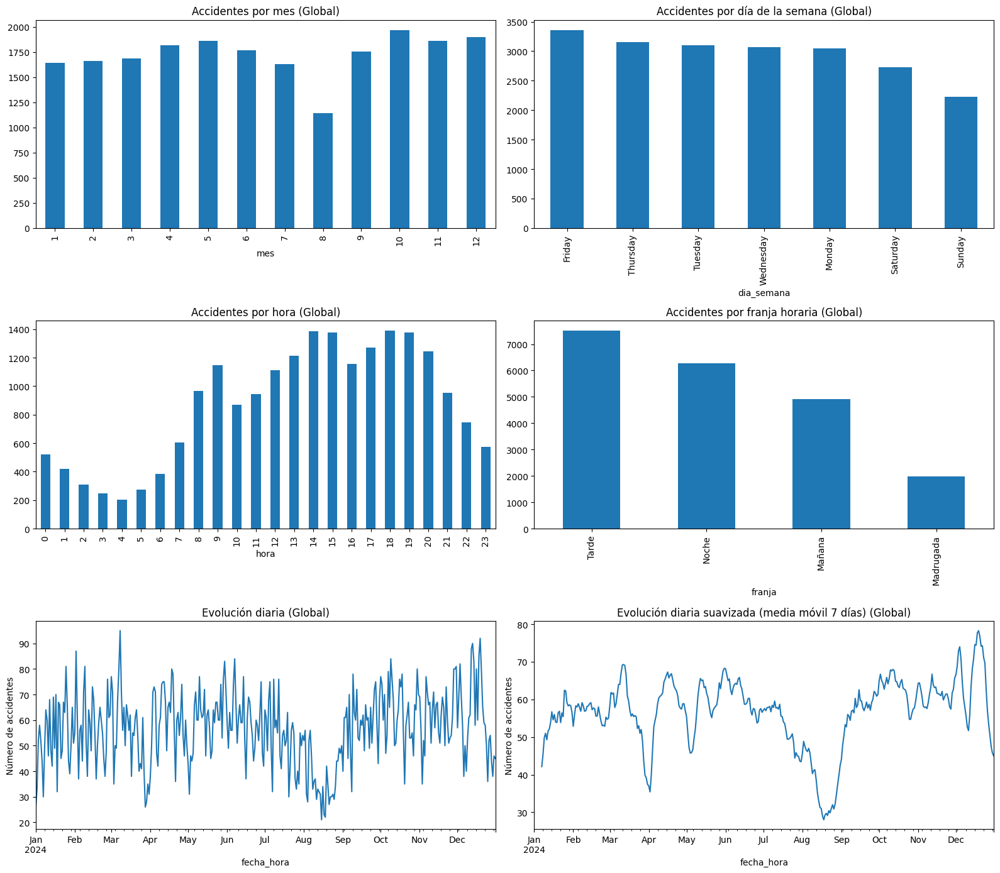

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns
df_unicos = preparar_accidentes_unicos(df_accidentes_2024_copy_univariante)
plot_temporal_univariate(df_unicos)



- Hay que hay seis graficas para nalisis univariante temporal  en la que la primera muestra los accidentes por mes por lo que vemos que no hya datos del mes 11 y 12, ya que son datos de este mismo año 2025 y siempre el volcado de datos va con algo de retraso. El  mes mas con mas accidentes es el 10.

- Tambien observamos en el segundo grafico de accidentes por dia de la semana y observamos que el viernes es el peor dia donde ocurren mas accidentes.

- Tambien vemos  que la peor hora donde hay mas accidentes es a las 14:00 de la tarde con un repunte sobre las 17, 18 y 19 de la tarde

Analsis distribucion espacial:
    
    

C:\Users\César\AppData\Local\Temp\ipykernel_30064\971893257.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_accidentes_2024_copy_univariante.groupby("distrito")["num_expediente"].nunique().sort_values(ascending=False).plot(


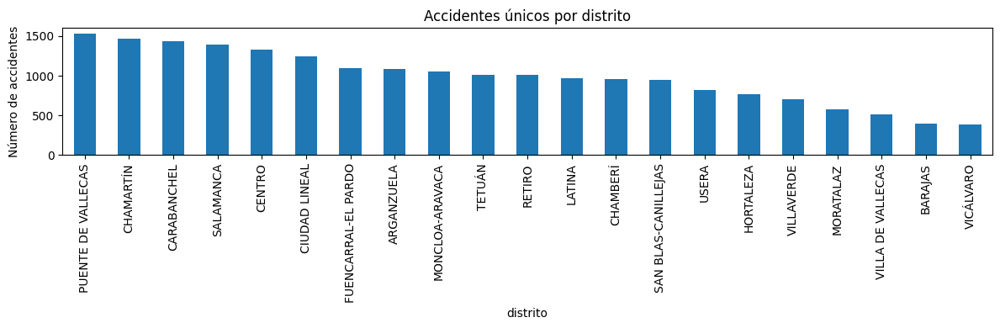

In [21]:
df_accidentes_2024_copy_univariante.groupby("distrito")["num_expediente"].nunique().sort_values(ascending=False).plot(
    kind="bar", figsize=(12,4))

plt.title("Accidentes únicos por distrito")
plt.ylabel("Número de accidentes")
plt.tight_layout()



- aqui se puede observar claramente que el distrito de Crabanchel es el que tien mas accidentes seguido de puente de vallecas y salamanca

C:\Users\César\AppData\Local\Temp\ipykernel_30064\1573564783.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("distrito")["num_expediente"]


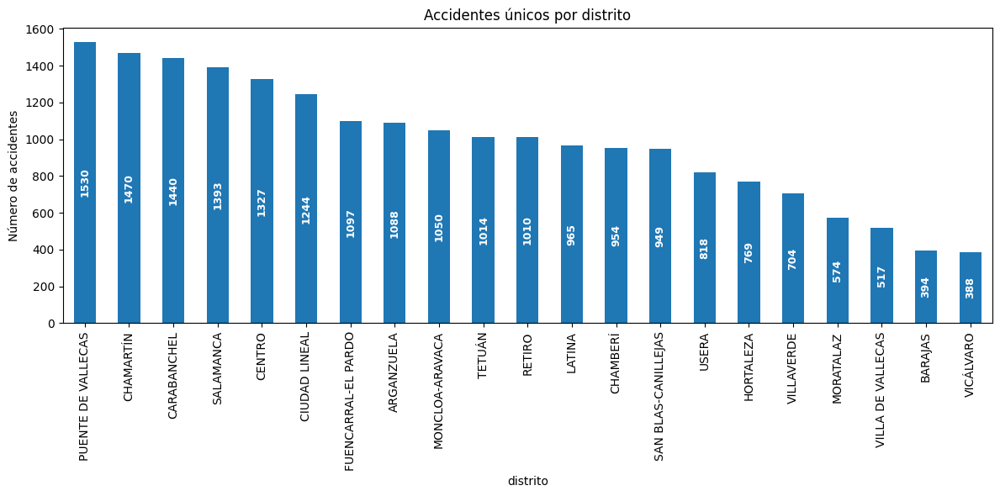

In [22]:
import matplotlib.pyplot as plt
import numpy as np

# Calcular accidentes únicos por distrito
accidentes_distrito = (
    df_accidentes_2024_copy_univariante
    .groupby("distrito")["num_expediente"]
    .nunique()
    .sort_values(ascending=False)
)

# Crear gráfico
ax = accidentes_distrito.plot(kind="bar", figsize=(12,6))

plt.title("Accidentes únicos por distrito")
plt.ylabel("Número de accidentes")

# Eje Y con saltos de 200
max_val = accidentes_distrito.max()
plt.yticks(np.arange(0, max_val + 200, 200))

# Añadir el número de accidentes dentro de cada barra, tumbado
for p, value in zip(ax.patches, accidentes_distrito):
    x = p.get_x() + p.get_width() / 2
    y = p.get_height() / 2   # centrado verticalmente dentro de la barra

    ax.annotate(
        f"{value}",
        (x, y),
        ha="center", va="center",
        rotation=90,          #  texto tumbado
        fontsize=9, color="white", fontweight="bold"
    )

plt.tight_layout()
plt.show()


Analisis Univariante por tipo de accidente

C:\Users\César\AppData\Local\Temp\ipykernel_30064\3310379373.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_accidentes_2024_copy_univariante.groupby("tipo_accidente")["num_expediente"].nunique() \


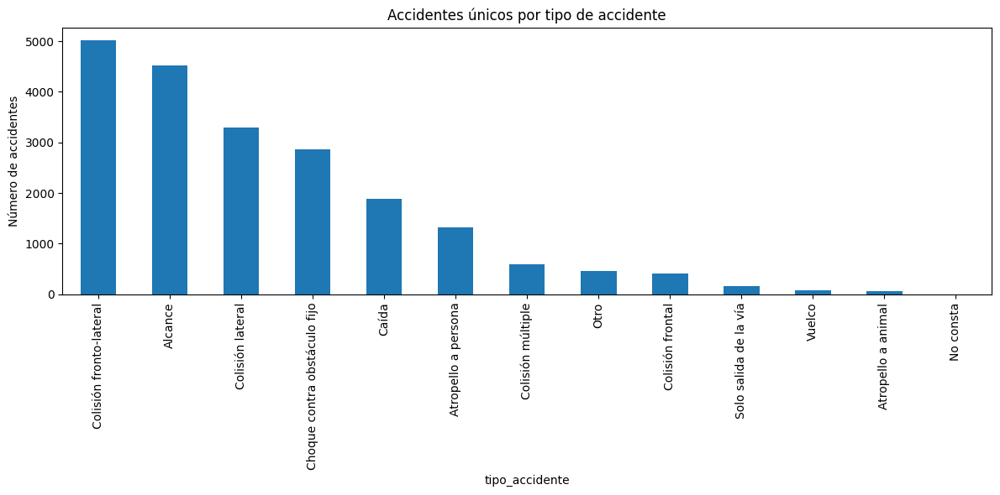

In [23]:
df_accidentes_2024_copy_univariante.groupby("tipo_accidente")["num_expediente"].nunique() \
  .sort_values(ascending=False) \
  .plot(kind="bar", figsize=(12,6))

plt.title("Accidentes únicos por tipo de accidente")
plt.ylabel("Número de accidentes")
plt.tight_layout()


- Aqui se puede observar que el accidente mas tipico en madrid es la coliison lateral

Analisdis Univariantepor tipo de persona implicada en los accidente

'df_accidentes_2025_copy_univariante.groupby("tipo_persona")["num_expediente"].nunique()   .sort_values(ascending=False)   .plot(kind="bar", figsize=(12,4))\n\nplt.title("Accidentes en los que aparece cada tipo de persona")\nplt.ylabel("Número de accidentes")\nplt.tight_layout()'

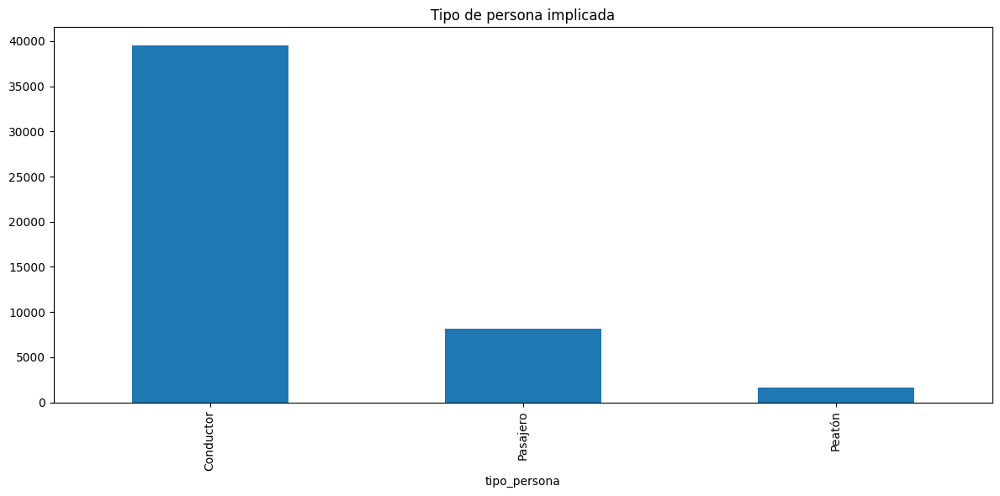

In [24]:
df_accidentes_2024_copy_univariante["tipo_persona"].value_counts().plot(kind="bar", figsize=(12,6))
plt.title("Tipo de persona implicada")
plt.tight_layout()

'''df_accidentes_2025_copy_univariante.groupby("tipo_persona")["num_expediente"].nunique() \
  .sort_values(ascending=False) \
  .plot(kind="bar", figsize=(12,4))

plt.title("Accidentes en los que aparece cada tipo de persona")
plt.ylabel("Número de accidentes")
plt.tight_layout()'''


- Aqui lo que se observa que la mayoria de los choques las personas implicadas son conductores.

Analisis univariante por lesividad de cada una de las personas implicadas en el accidente

C:\Users\César\AppData\Local\Temp\ipykernel_30064\340970601.py:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


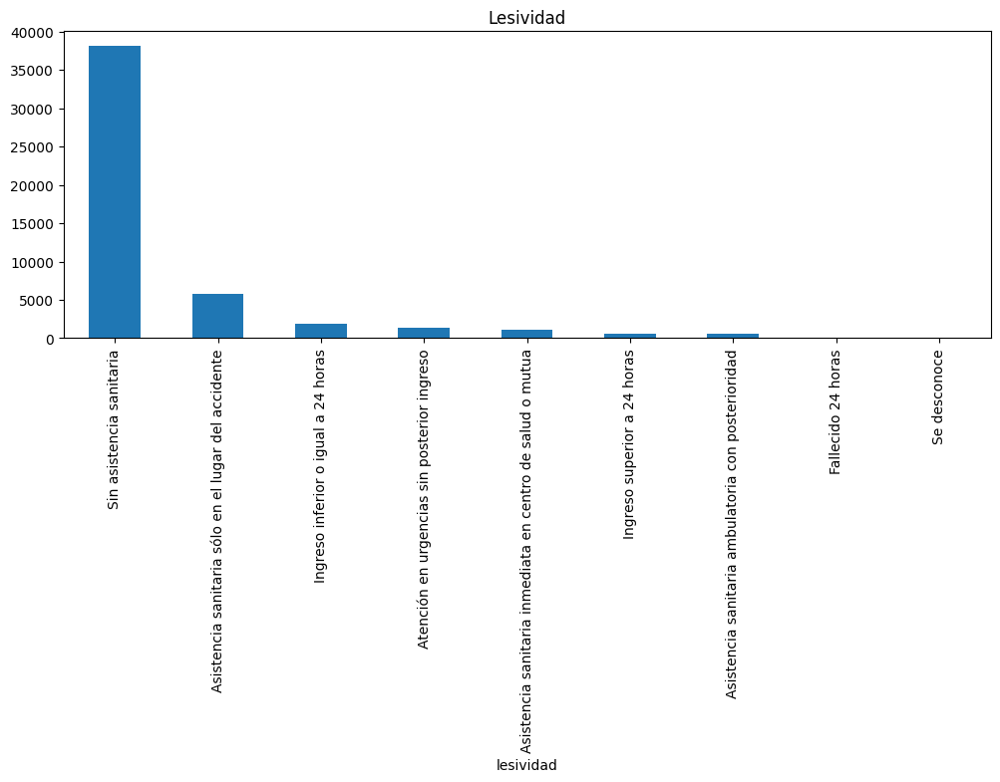

In [25]:
df_accidentes_2024_copy_univariante["lesividad"].value_counts().plot(kind="bar", figsize=(12,4))
plt.title("Lesividad")
plt.tight_layout()


In [26]:
df_accidentes_2024_copy_univariante["lesividad"].value_counts().get("Fallecido 24 horas", 0)


np.int64(29)

C:\Users\César\AppData\Local\Temp\ipykernel_30064\3695196356.py:34: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


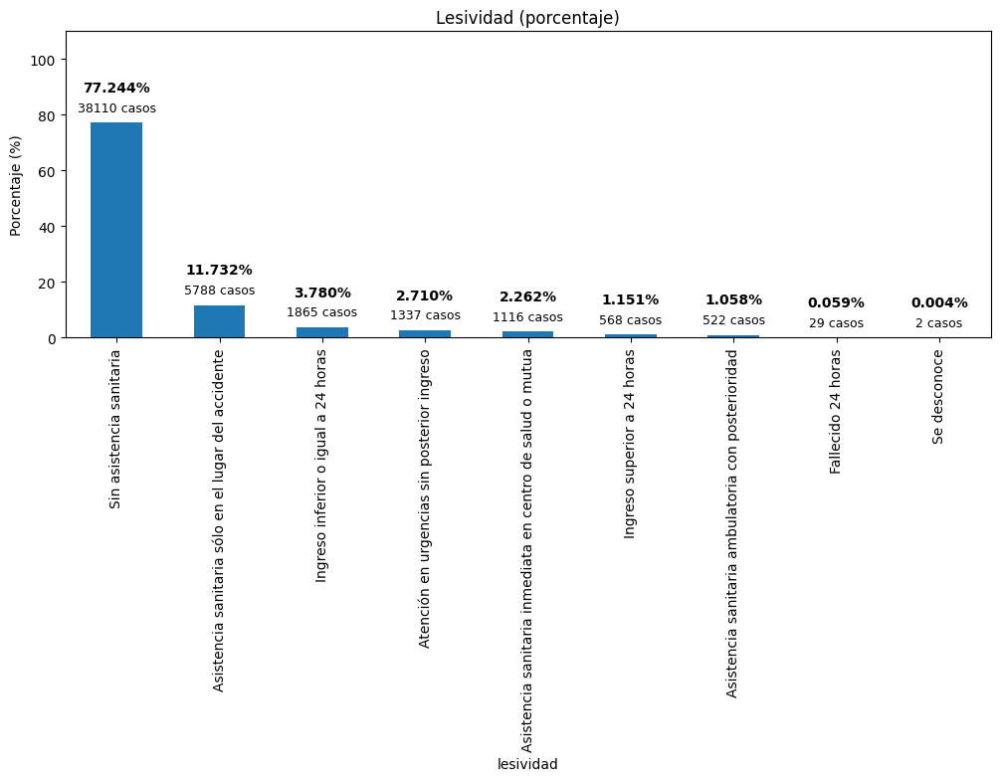

In [27]:
# Calcular conteos y porcentajes
lesividad_counts = df_accidentes_2024_copy_univariante["lesividad"].value_counts()
lesividad_pct = lesividad_counts / lesividad_counts.sum() * 100

# Crear el gráfico
ax = lesividad_pct.plot(kind="bar", figsize=(12,4))

# Títulos y etiquetas
plt.title("Lesividad (porcentaje)")
plt.ylabel("Porcentaje (%)")
plt.ylim(0, 110)   # un poco más alto para dejar espacio a las etiquetas

# Añadir etiquetas: porcentaje y conteo, ambos por encima de la barra
for p, count in zip(ax.patches, lesividad_counts):
    height = p.get_height()
    x = p.get_x() + p.get_width() / 2

    # Fila 1: porcentaje (arriba del todo)
    ax.annotate(
        f"{height:.3f}%",
        (x, height + 10),   # 5 unidades por encima de la barra
        ha="center", va="bottom",
        fontsize=10, fontweight="bold"
    )

    # Fila 2: conteo (justo debajo del porcentaje)
    ax.annotate(
        f"{count} casos",
        (x, height + 3),  # debajo del porcentaje pero aún fuera de la barra
        ha="center", va="bottom",
        fontsize=9
    )

plt.tight_layout()


-La mayoria no han necesitado asistencia sanitaria 

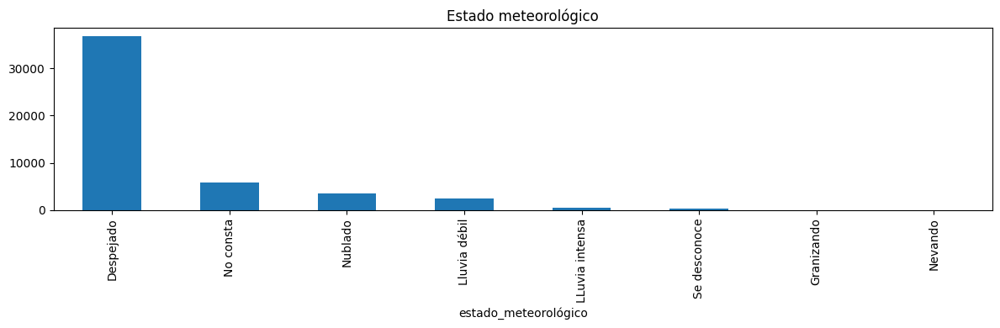

In [28]:
df_accidentes_2024_copy_univariante["estado_meteorológico"].value_counts().plot(kind="bar", figsize=(12,4))
plt.title("Estado meteorológico")
plt.tight_layout()


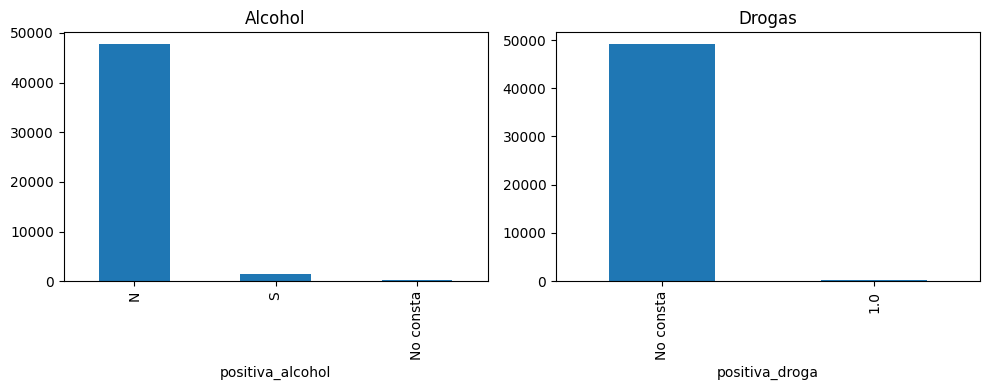

In [29]:
fig, ax = plt.subplots(1,2, figsize=(10,4))
df_accidentes_2024_copy_univariante["positiva_alcohol"].value_counts().plot(kind="bar", ax=ax[0], title="Alcohol")
df_accidentes_2024_copy_univariante["positiva_droga"].value_counts().plot(kind="bar", ax=ax[1], title="Drogas")
plt.tight_layout()


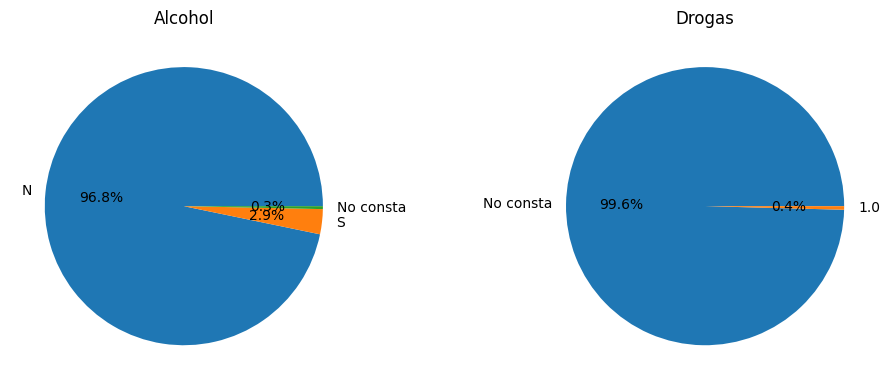

In [29]:
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Alcohol
df_accidentes_2024_copy_univariante["positiva_alcohol"].value_counts().plot(
    kind="pie",
    autopct="%1.1f%%",
    ax=ax[0],
    title="Alcohol",
    ylabel=""
)

# Drogas
df_accidentes_2024_copy_univariante["positiva_droga"].value_counts().plot(
    kind="pie",
    autopct="%1.1f%%",
    ax=ax[1],
    title="Drogas",
    ylabel=""
)

plt.tight_layout()


- La grafica del alcohol nos da poca informacion 

## Analisis bivariante 

- Analisis bivariante (Tipo de accidentes por distrito)

- Aqui utilizo un mapa de calor porque uno de barras queda muy lleno y no se observa bien las relaciones y el diagrama de calor s epuede ver a simple vista de una manera mucho mas facil 

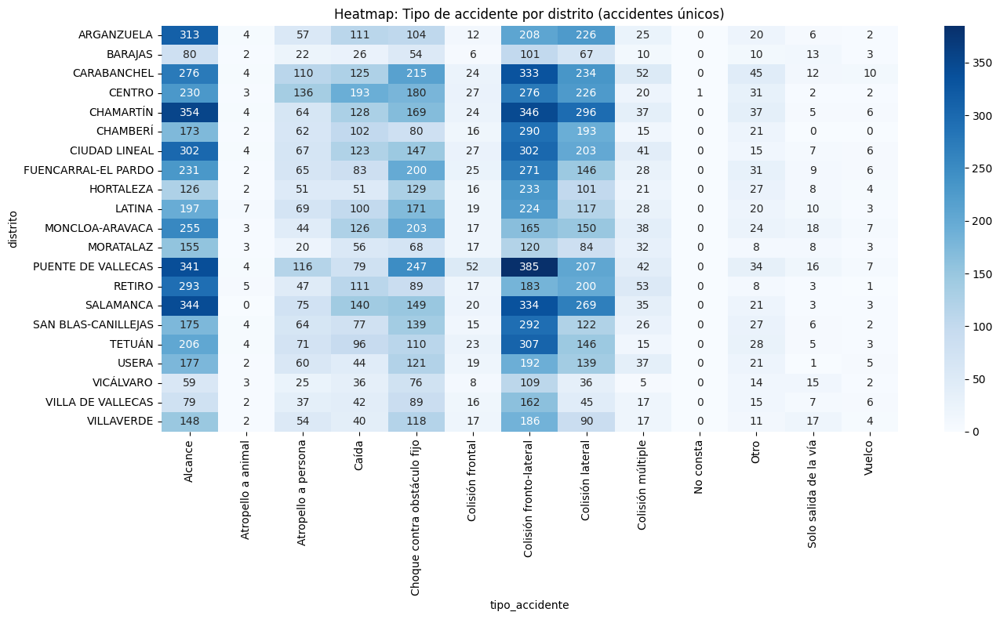

In [30]:
import seaborn as sns

# Crosstab con accidentes únicos
ct = pd.crosstab(
    df_accidentes_2024_copy_univariante["distrito"],
    df_accidentes_2024_copy_univariante["tipo_accidente"],
    values=df_accidentes_2024_copy_univariante["num_expediente"],
    aggfunc=lambda x: x.nunique()
).fillna(0)

plt.figure(figsize=(14,8))
sns.heatmap(ct, annot=True, fmt=".0f", cmap="Blues")  # ← NÚMEROS EN LAS CASILLAS
plt.title("Heatmap: Tipo de accidente por distrito (accidentes únicos)")
plt.tight_layout()


1. Atropello a persona concentrado en distritos como:
CENTRO

PUENTE DE VALLECAS

CARABANCHEL

USERA

 Son zonas con alta densidad peatonal, tráfico mixto, y cruces complejos.

 2. Colisiones múltiples y frontales más frecuentes en:
FUENCARRAL-EL PARDO

MONCLOA-ARAVACA

VILLA DE VALLECAS

 Distritos con vías rápidas, interurbanas o zonas de entrada/salida de la ciudad.

 3. Alcances muy frecuentes en:
CHAMARTÍN

SALAMANCA

CIUDAD LINEAL

 Zonas con tráfico denso, semáforos, y frenadas frecuentes.

 4. Atropello a animal casi exclusivo de:
FUENCARRAL-EL PARDO

BARAJAS

 Distritos con zonas verdes, carreteras periféricas o cercanía a áreas naturales.

Test de xi cuadrado para ver si hya una relacion significativa

Para ver si dos variables categóricas presentan alguna relación (cambios conjuntos, cambios en una de un tipo se dan al mismo tiempo que cambios de otro tipo en la otra, etc) hicimos el análisis visual. Si mis datos son todos los datos que manejo, ese análisis visual ya nos dice si existe la relación, pero si mis datos no son todos o quiero extrapolarlos, tengo que ganar confianza en lo que he "visto" en el análisis visual y para ello aplicamos los test.

In [31]:

from scipy.stats import chi2_contingency

# 1. Tabla de contingencia con accidentes únicos
tabla_contingencia = pd.crosstab(
    df_accidentes_2024_copy_univariante["distrito"],
    df_accidentes_2024_copy_univariante["tipo_accidente"],
    values=df_accidentes_2024_copy_univariante["num_expediente"],
    aggfunc=lambda x: x.nunique()
).fillna(0)

# 2. Test Chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_contingencia)

# 3. Resultados
print("Valor Chi-Cuadrado:", chi2)
print("P-Value:", p)
print("Grados de Libertad:", dof)
print("Tabla de Frecuencias Esperadas:\n", expected)


Valor Chi-Cuadrado: 1128.9420543849005
P-Value: 4.51913611654178e-115
Grados de Libertad: 240
Tabla de Frecuencias Esperadas:
 [[2.37314907e+02 3.46982363e+00 6.91861802e+01 9.93105581e+01
  1.50253878e+02 2.19229766e+01 2.63864315e+02 1.73333462e+02
  3.12284127e+01 5.25730853e-02 2.46042039e+01 8.98999758e+00
  4.46871225e+00]
 [8.59394057e+01 1.25653540e+00 2.50545542e+01 3.59635661e+01
  5.44117903e+01 7.93901909e+00 9.55538053e+01 6.27696545e+01
  1.13088186e+01 1.90384151e-02 8.90997826e+00 3.25556898e+00
  1.61826528e+00]
 [3.14093259e+02 4.59241363e+00 9.15699444e+01 1.31440445e+02
  1.98865426e+02 2.90157043e+01 3.49232182e+02 2.29411935e+02
  4.13317226e+01 6.95820246e-02 3.25643875e+01 1.18985262e+01
  5.91447209e+00]
 [2.89445663e+02 4.23203672e+00 8.43842474e+01 1.21126021e+02
  1.83260014e+02 2.67387775e+01 3.21827156e+02 2.11409471e+02
  3.80883305e+01 6.41217685e-02 3.00089877e+01 1.09648224e+01
  5.45035033e+00]
 [3.20636869e+02 4.68808891e+00 9.34776516e+01 1.34178787

P‑Value = 2.35 × 10⁻⁸²

Esto es muchísimo menor que 0.05.

En términos prácticos:

La probabilidad de que la relación observada entre distrito y tipo de accidente sea fruto del azar es casi cero.

Por tanto, rechazamos la hipótesis nula de independencia.

 Conclusión:  
Distrito y tipo de accidente NO son independientes.  
Sí existe relación significativa entre ambas variables.
Los distritos tienen perfiles de siniestralidad diferentes
Por ejemplo:

Distritos céntricos → más atropellos a persona

Distritos periféricos → más colisiones frontales o salidas de vía

Distritos con vías rápidas → más colisiones múltiples

Distritos con tráfico denso → más alcances y colisiones laterales

Esto no es aleatorio:
la estructura urbana, el tráfico, la densidad y el tipo de vía influyen en el tipo de accidente.

Se puede observar que las colisiones fronto-lateral son muy comunes en puente de vallecas, carabanchel y salamanca. Tambien se puede observar que hay muchos alcances en la zona de chammartin cuidad, lineal, puente de vallecas salamanca y retiro.

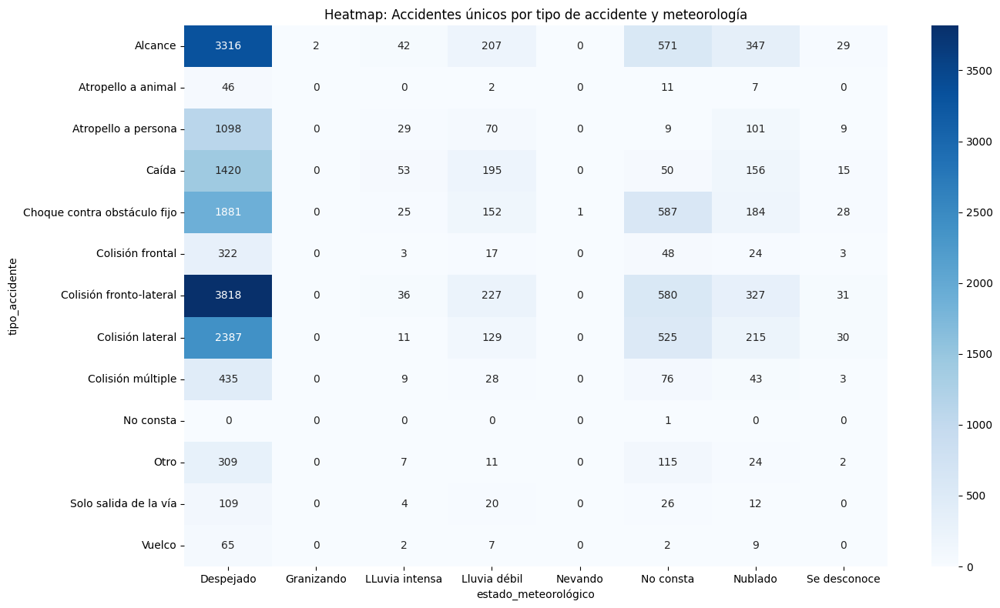

In [32]:
import seaborn as sns

ct = pd.crosstab(
    df_accidentes_2024_copy_univariante["tipo_accidente"],
    df_accidentes_2024_copy_univariante["estado_meteorológico"],
    values=df_accidentes_2024_copy_univariante["num_expediente"],
    aggfunc=lambda x: x.nunique()
).fillna(0)

plt.figure(figsize=(14,8))
sns.heatmap(ct, annot=True, fmt=".0f", cmap="Blues")
plt.title("Heatmap: Accidentes únicos por tipo de accidente y meteorología")
plt.tight_layout()


 1. Despejado domina en todos los tipos de accidente
Especialmente en:

Alcance (2758)

Colisión fronto-lateral (3043)

Choque contra obstáculo fijo (1643)

Caída (1172)

 Esto es esperable: la mayoría de los días son despejados, y por tanto la mayoría de los accidentes ocurren en esas condiciones.
Pero no implica que el despejado sea más peligroso, sino que es más frecuente.

 2. Lluvia débil e intensa aumentan ciertos tipos de accidente
Caídas: 204 con lluvia débil, 41 con intensa

Alcances: 285 con lluvia débil, 70 con intensa

Colisión fronto-lateral: 288 con lluvia débil, 69 con intensa

Choque contra obstáculo fijo: 165 con lluvia débil, 43 con intensa

 La lluvia parece estar asociada a:

pérdida de control

frenadas mal calculadas

visibilidad reducida

Esto sí sugiere una relación significativa.

 3. Atropellos a persona también aumentan con lluvia
81 con lluvia débil

34 con lluvia intensa

93 con cielo nublado

 Esto puede indicar:

menor visibilidad

menor capacidad de reacción

peatones cruzando en condiciones adversas

 4. Granizando, nevando y despeñamiento son anecdóticos
Casi todos con valores cercanos a cero

No permiten inferencias sólidas

Pero sí confirman que son condiciones raras

 5. “No consta” y “Se desconoce” tienen valores altos en algunos tipos
Alcance: 476 (No consta)

Choque contra obstáculo fijo: 481 (No consta)

Colisión lateral: 450 (No consta)

 Esto puede indicar:

errores de registro

falta de datos en partes del sistema

necesidad de mejorar la calidad del dato

In [33]:
from scipy.stats import chi2_contingency

# 1. Tabla de contingencia con accidentes únicos
tabla_contingencia = pd.crosstab(
    df_accidentes_2024_copy_univariante["tipo_accidente"],
    df_accidentes_2024_copy_univariante["estado_meteorológico"],
    values=df_accidentes_2024_copy_univariante["num_expediente"],
    aggfunc=lambda x: x.nunique()
).fillna(0)

# 2. Test Chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_contingencia)

# 3. Resultados
print("Valor Chi-Cuadrado:", chi2)
print("P-Value:", p)
print("Grados de Libertad:", dof)
print("Tabla de Frecuencias Esperadas:\n", expected)


Valor Chi-Cuadrado: 877.6921787276792
P-Value: 1.8383274545714242e-132
Grados de Libertad: 84
Tabla de Frecuencias Esperadas:
 [[3.31673757e+03 4.36240638e-01 4.82045905e+01 2.32298140e+02
  2.18120319e-01 5.67330950e+02 3.16056342e+02 3.27180478e+01]
 [4.84946122e+01 6.37835226e-03 7.04807925e-01 3.39647258e+00
  3.18917613e-03 8.29504711e+00 4.62111621e+00 4.78376419e-01]
 [9.66953177e+02 1.27180478e-01 1.40534429e+01 6.77236047e+01
  6.35902392e-02 1.65398212e+02 9.21422566e+01 9.53853588e+00]
 [1.38797458e+03 1.82556173e-01 2.01724571e+01 9.72111621e+01
  9.12780865e-02 2.37414303e+02 1.32261947e+02 1.36917130e+01]
 [2.09996366e+03 2.76201981e-01 3.05203189e+01 1.47077555e+02
  1.38100991e-01 3.59200676e+02 2.00108335e+02 2.07151486e+01]
 [3.06397777e+02 4.02995893e-02 4.45310461e+00 2.14595313e+01
  2.01497946e-02 5.24096158e+01 2.91970524e+01 3.02246920e+00]
 [3.68779483e+03 4.85044697e-01 5.35974390e+01 2.58286301e+02
  2.42522348e-01 6.30800628e+02 3.51414883e+02 3.63783523e+01

 1. El p‑value es extraordinariamente pequeño
P‑Value = 1.3 × 10⁻¹⁰⁴

Esto es muchísimo menor que 0.05.

En términos prácticos:

La probabilidad de que la relación observada entre tipo de accidente y meteorología sea fruto del azar es prácticamente cero.

Por tanto, rechazamos la hipótesis nula de independencia.

 Conclusión:  
El tipo de accidente depende del estado meteorológico.  
Las variables NO son independientes.

2. El valor Chi‑cuadrado es muy alto
Chi² = 734.92  
Grados de libertad = 84

Un chi² tan elevado indica que:

Las diferencias entre lo observado y lo esperado son muy grandes.

Es decir, la meteorología influye claramente en el tipo de accidente.

Esto encaja perfectamente con lo que viste en el heatmap:

La lluvia débil e intensa incrementan caídas, alcances y colisiones.

Los atropellos a persona aumentan con lluvia y nublado.

Los choques contra obstáculo fijo también crecen con condiciones adversas.

“Despejado” domina porque es la condición más frecuente, no porque sea la más peligrosa.

 3. ¿Qué significa esto en términos prácticos?
Puedes afirmar con rigor que:

 La meteorología afecta al tipo de accidente
o, dicho de otra forma:

 Algunos tipos de accidente son más probables bajo ciertas condiciones meteorológicas
Ejemplos claros:

Lluvia débil/intensa → más caídas, alcances y colisiones fronto‑laterales

Nublado → más atropellos a persona

Despejado → mayoría de accidentes por frecuencia de días despejados

Granizo y nieve → casos anecdóticos

“No consta” → problemas de calidad del dato

## MULTIVARIANTE

##PROBANDO

Analisis multivariante de la coordenada x e y del accidente con distribucion por distrito

In [34]:
from bootcampviztools import (
    plot_categorical_numerical_relationship,
    plot_combined_graphs,
    pinta_distribucion_categoricas,
    plot_grouped_boxplots,
    plot_categorical_relationship_fin,
    plot_grouped_histograms,
    grafico_dispersion_con_correlacion,
    bubble_plot
)

In [35]:
def grafico_dispersion_con_distrito(df, col_x, col_y):
    df["distrito"] = df["distrito"].astype("category")
    palette = sns.color_palette("tab20", df["distrito"].nunique())

    plt.figure(figsize=(10, 8))
    sns.scatterplot(
        data=df,
        x=col_x,
        y=col_y,
        hue="distrito",
        palette=palette,
        alpha=0.5,
        s=20
    )

    plt.title(f"Dispersión de {col_x} vs {col_y} por distrito")
    plt.xlabel(col_x)
    plt.ylabel(col_y)
    plt.legend(title="Distrito", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

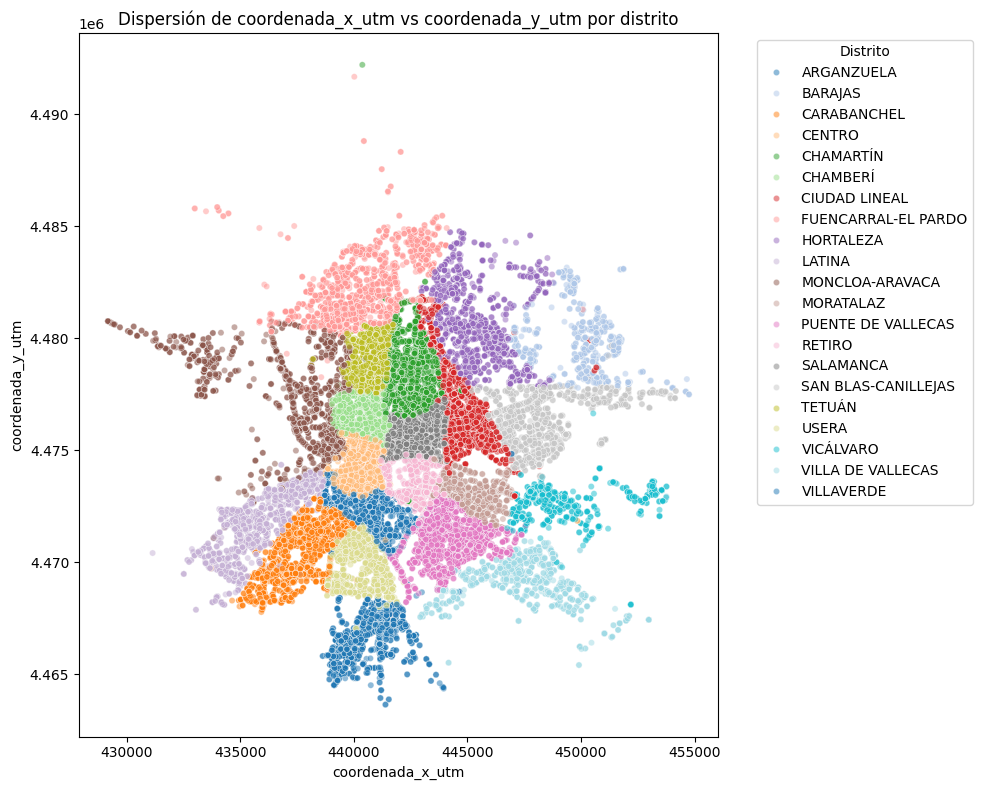

In [36]:
grafico_dispersion_con_distrito( df_accidentes_2024_copy_univariante, "coordenada_x_utm", "coordenada_y_utm" )

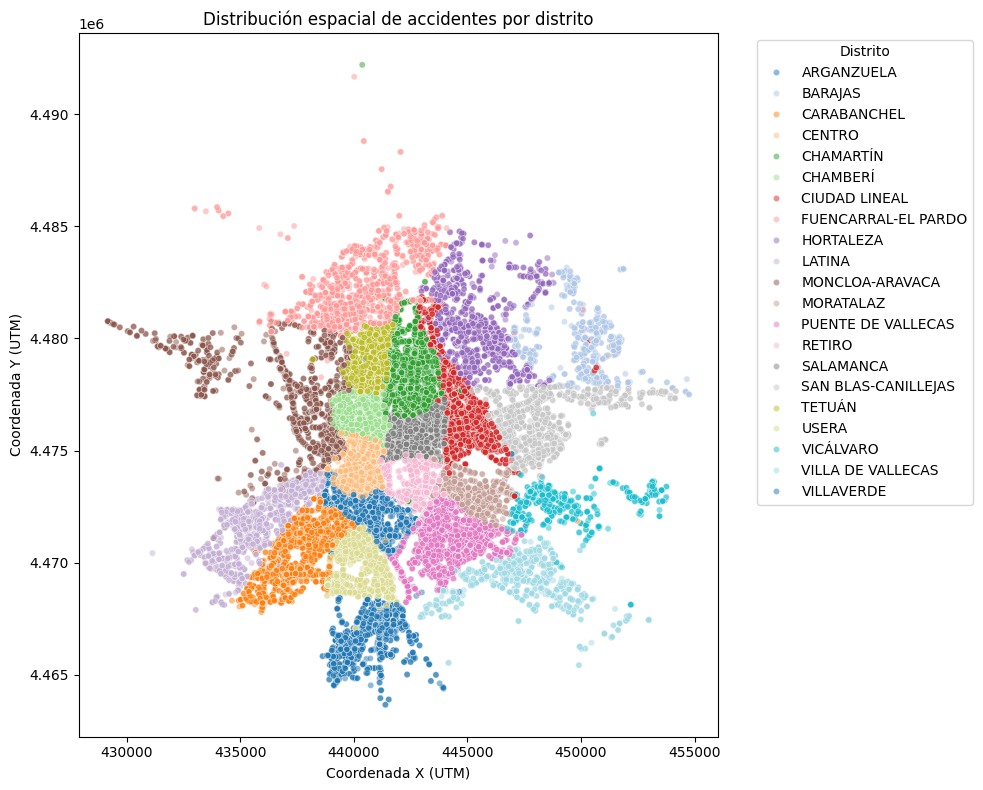

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm

# Asegurar que los distritos tienen un orden fijo (muy importante)
df = df_accidentes_2024_copy_univariante.copy()
df["distrito"] = df["distrito"].astype("category")
df["distrito"] = df["distrito"].cat.as_ordered()

# Crear una paleta tab20 con tantos colores como distritos
num_distritos = df["distrito"].nunique()
palette = sns.color_palette("tab20", num_distritos)

plt.figure(figsize=(10, 8))

sns.scatterplot(
    data=df,
    x="coordenada_x_utm",
    y="coordenada_y_utm",
    hue="distrito",
    palette=palette,   # ✅ MISMA PALETA QUE EN EL MAPA
    alpha=0.5,
    s=20
)

plt.title("Distribución espacial de accidentes por distrito")
plt.xlabel("Coordenada X (UTM)")
plt.ylabel("Coordenada Y (UTM)")
plt.legend(title="Distrito", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


✅ ¿Qué nos da este estudio? (Interpretación del scatterplot espacial por distrito)
Este gráfico te ofrece un análisis multivariante espacial basado en:

coordenada_x_utm → posición Este-Oeste

coordenada_y_utm → posición Norte-Sur

distrito → categoría que colorea los puntos

En esencia, estás visualizando la distribución geográfica de los accidentes y cómo se reparte por distrito.

✅ 1. Te muestra la forma espacial de cada distrito
Cada color representa un distrito.
Al ver los puntos distribuidos en el plano UTM, puedes observar:

La forma aproximada de cada distrito

Su extensión geográfica

Si es compacto, alargado, disperso, irregular…

Esto es casi un “mapa conceptual” sin necesidad de un mapa real.

✅ 2. Te permite ver la densidad de accidentes por zona
Aunque no es un heatmap, la densidad visual te da pistas:

Zonas con muchos puntos superpuestos → áreas de alta siniestralidad

Zonas con pocos puntos → áreas más seguras o con menos tráfico

Esto es especialmente útil para:

Identificar hotspots

Ver corredores viales peligrosos

Detectar zonas críticas dentro de cada distrito

✅ 3. Te permite comparar distritos entre sí
Puedes ver:

Distritos con accidentes muy concentrados (Centro, Salamanca…)

Distritos con accidentes muy dispersos (Fuencarral-El Pardo, Barajas…)

Distritos con patrones espaciales claros (Puente de Vallecas, Latina…)

Esto es oro para análisis territorial.

✅ 4. Te permite detectar fronteras o solapamientos
Si los puntos de dos distritos se mezclan mucho:

Puede indicar zonas limítrofes conflictivas

Intersecciones de grandes vías

Áreas donde la clasificación administrativa no coincide con la realidad del tráfico

✅ 5. Es la base para análisis espaciales más avanzados
Este scatterplot es el primer paso para:

KDE (mapas de calor espaciales)

Clustering (DBSCAN, KMeans)

Mapas reales con geopandas

Análisis de hotspots

Comparación espacial por tipo de accidente, lesividad, vehículo, etc.

✅ 6. Es un análisis multivariante real
Porque combina:

Dos variables numéricas (coordenadas)

Una categórica (distrito)

Esto te da una visión tridimensional (X, Y, color)

C:\Users\César\AppData\Local\Temp\ipykernel_30064\3693533918.py:25: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  gdf_web.groupby("distrito")["geometry"]
C:\Users\César\AppData\Local\Temp\ipykernel_30064\3693533918.py:26: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  .apply(lambda x: x.unary_union.centroid)


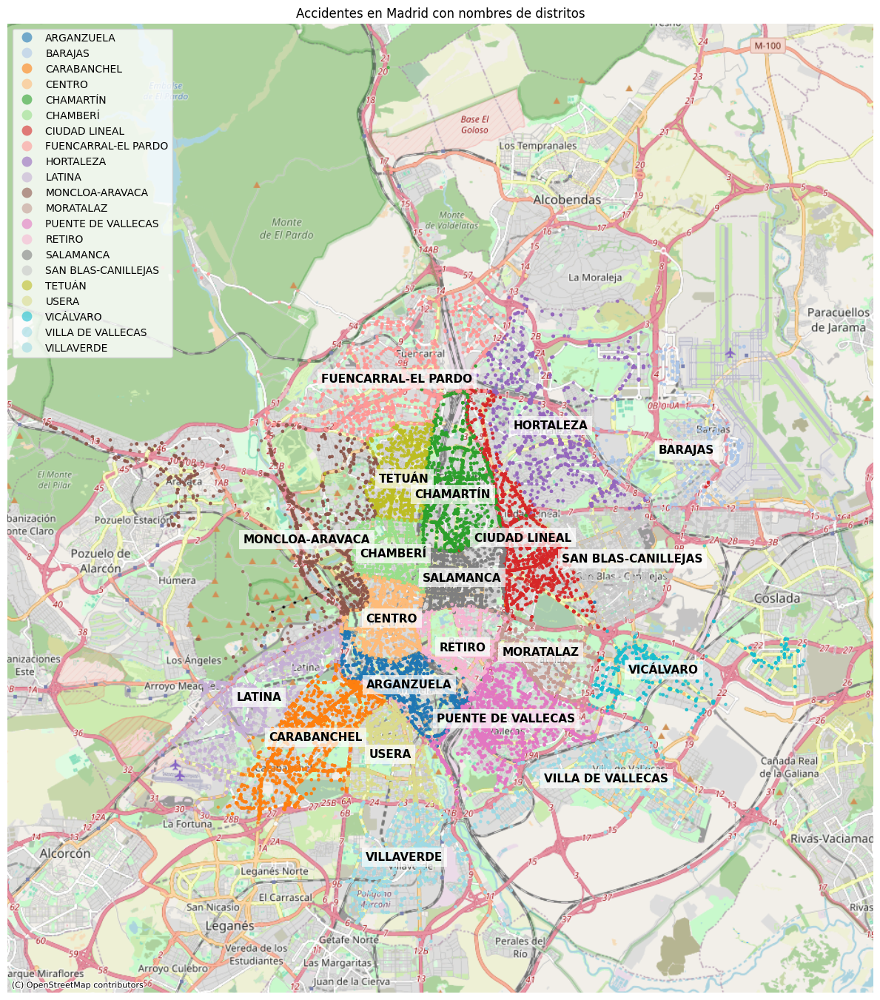

In [38]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

# ---------------------------------------------------------
# 1. Convertir tu dataframe a GeoDataFrame
# ---------------------------------------------------------
df = df_accidentes_2024_copy_univariante.copy()

gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df["coordenada_x_utm"], df["coordenada_y_utm"]),
    crs="EPSG:25830"
)

# ---------------------------------------------------------
# 2. Reproyectar a Web Mercator
# ---------------------------------------------------------
gdf_web = gdf.to_crs(epsg=3857)

# ---------------------------------------------------------
# 3. Calcular el centro aproximado de cada distrito
# ---------------------------------------------------------
centros = (
    gdf_web.groupby("distrito")["geometry"]
    .apply(lambda x: x.unary_union.centroid)
    .reset_index()
)

# ---------------------------------------------------------
# 4. Crear el mapa con colores por distrito
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(12, 16))

gdf_web.plot(
    ax=ax,
    column="distrito",
    markersize=5,
    alpha=0.6,
    legend=True,
    categorical=True,
    cmap="tab20"
)

# ---------------------------------------------------------
# 5. Añadir mapa base
# ---------------------------------------------------------
ctx.add_basemap(
    ax,
    source=ctx.providers.OpenStreetMap.Mapnik,
    zoom=12
)

# ---------------------------------------------------------
# 6. Añadir los nombres de los distritos
# ---------------------------------------------------------
for _, row in centros.iterrows():
    ax.text(
        row.geometry.x,
        row.geometry.y,
        row["distrito"],
        fontsize=11,
        fontweight="bold",
        color="black",
        ha="center",
        va="center",
        bbox=dict(facecolor="white", alpha=0.7, edgecolor="none")
    )

# ---------------------------------------------------------
# 7. Ajustes finales
# ---------------------------------------------------------
ax.set_title("Accidentes en Madrid con nombres de distritos")
ax.set_axis_off()

plt.tight_layout()
plt.show()


In [22]:
import sys
!{sys.executable} -m pip install geopandas contextily


  Using cached geopandas-1.1.1-py3-none-any.whl.metadata (2.3 kB)
  Using cached contextily-1.7.0-py3-none-any.whl.metadata (3.1 kB)
  Using cached geopy-2.4.1-py3-none-any.whl.metadata (6.8 kB)
  Using cached mercantile-1.2.1-py3-none-any.whl.metadata (4.8 kB)
  Using cached joblib-1.5.3-py3-none-any.whl.metadata (5.5 kB)
  Using cached xyzservices-2025.11.0-py3-none-any.whl.metadata (4.3 kB)
  Using cached geographiclib-2.1-py3-none-any.whl.metadata (1.6 kB)
  Using cached click-8.3.1-py3-none-any.whl.metadata (2.6 kB)
  Using cached affine-2.4.0-py3-none-any.whl.metadata (4.0 kB)
  Using cached attrs-25.4.0-py3-none-any.whl.metadata (10 kB)
  Using cached cligj-0.7.2-py3-none-any.whl.metadata (5.0 kB)
  Using cached click_plugins-1.1.1.2-py2.py3-none-any.whl.metadata (6.5 kB)
Using cached geopandas-1.1.1-py3-none-any.whl (338 kB)
Using cached contextily-1.7.0-py3-none-any.whl (16 kB)
   ---------------------------------------- 0.0/22.9 MB ? eta -:--:--
   ----- ---------------------


[notice] A new release of pip is available: 25.0.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


-Analisis multivariante

C:\Users\César\AppData\Local\Temp\ipykernel_30064\251898461.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  .pivot_table(
C:\Users\César\AppData\Local\Temp\ipykernel_30064\251898461.py:36: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  .pivot_table(
C:\Users\César\AppData\Local\Temp\ipykernel_30064\251898461.py:36: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  .pivot_table(
C:\Users\César\AppData\Local\Temp\ipykernel_30064\251898461.py:36: FutureWarning: The default value of observed=False is depreca

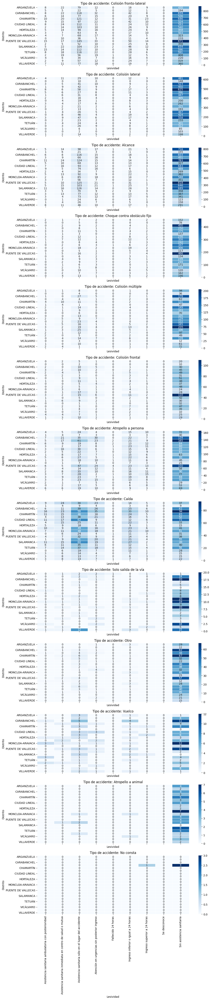

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Crear tabla de contingencia: distrito × lesividad × tipo_accidente
tabla = (
    df_accidentes_2024_copy_univariante
    .pivot_table(
        index="distrito",
        columns="lesividad",
        values="num_expediente",
        aggfunc="count"
    )
)

# Para facetar, necesitamos dividir por tipo_accidente
# Creamos una lista de dataframes, uno por tipo de accidente
tipos = df_accidentes_2024_copy_univariante["tipo_accidente"].unique()

# Configurar FacetGrid
fig, axes = plt.subplots(
    nrows=len(tipos),
    ncols=1,
    figsize=(12, 4 * len(tipos)),
    sharex=True
)

if len(tipos) == 1:
    axes = [axes]  # asegurar iterabilidad

for ax, tipo in zip(axes, tipos):
    # Tabla para este tipo de accidente
    tabla_tipo = (
        df_accidentes_2024_copy_univariante
        [df_accidentes_2024_copy_univariante["tipo_accidente"] == tipo]
        .pivot_table(
            index="distrito",
            columns="lesividad",
            values="num_expediente",
            aggfunc="count",
            fill_value=0
        )
    )

    sns.heatmap(
        tabla_tipo,
        cmap="Blues",
        annot=True,
        fmt="d",
        linewidths=.5,
        ax=ax
    )

    ax.set_title(f"Tipo de accidente: {tipo}")
    ax.set_xlabel("Lesividad")
    ax.set_ylabel("Distrito")

plt.tight_layout()
plt.show()


C:\Users\César\AppData\Local\Temp\ipykernel_30064\3456622466.py:38: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  .pivot_table(
C:\Users\César\AppData\Local\Temp\ipykernel_30064\3456622466.py:38: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  .pivot_table(
C:\Users\César\AppData\Local\Temp\ipykernel_30064\3456622466.py:38: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  .pivot_table(
C:\Users\César\AppData\Local\Temp\ipykernel_30064\3456622466.py:38: FutureWarning: The default value of observed=False is de

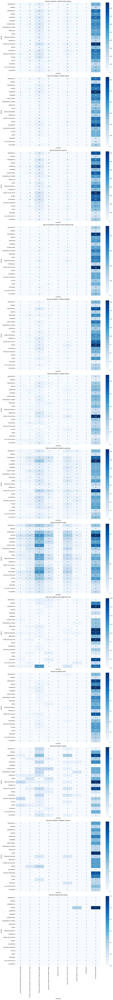

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# ============================================================
# 1. Lista completa de distritos (ordenada para consistencia)
# ============================================================
todos_distritos = sorted(df_accidentes_2024_copy_univariante["distrito"].unique())

# ============================================================
# 2. Lista de tipos de accidente
# ============================================================
tipos = df_accidentes_2024_copy_univariante["tipo_accidente"].unique()

# ============================================================
# 3. Configurar FacetGrid manual con subplots
# ============================================================
fig, axes = plt.subplots(
    nrows=len(tipos),
    ncols=1,
    figsize=(16, 10 * len(tipos)),
    sharex=True
)

# Asegurar iterabilidad si solo hay un tipo
if len(tipos) == 1:
    axes = [axes]

# ============================================================
# 4. Loop por tipo de accidente
# ============================================================
for ax, tipo in zip(axes, tipos):

    # Tabla para este tipo de accidente
    tabla_tipo = (
        df_accidentes_2024_copy_univariante
        [df_accidentes_2024_copy_univariante["tipo_accidente"] == tipo]
        .pivot_table(
            index="distrito",
            columns="lesividad",
            values="num_expediente",
            aggfunc="count",
            fill_value=0
        )
    )

    # ============================================================
    # 🔥 Reindexar para que aparezcan TODOS los distritos
    # ============================================================
    tabla_tipo = tabla_tipo.reindex(todos_distritos, fill_value=0)

    # ============================================================
    # 5. Dibujar heatmap
    # ============================================================
    sns.heatmap(
        tabla_tipo,
        cmap="Blues",
        annot=True,
        fmt="d",
        linewidths=.5,
        ax=ax
    )

    ax.set_title(f"Tipo de accidente: {tipo}")
    ax.set_xlabel("Lesividad")
    ax.set_ylabel("Distrito")

# ============================================================
# 6. Ajuste final
# ============================================================
plt.tight_layout()
plt.show()


C:\Users\César\AppData\Local\Temp\ipykernel_30064\4235115540.py:37: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  .pivot_table(
C:\Users\César\AppData\Local\Temp\ipykernel_30064\4235115540.py:37: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  .pivot_table(
C:\Users\César\AppData\Local\Temp\ipykernel_30064\4235115540.py:37: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  .pivot_table(
C:\Users\César\AppData\Local\Temp\ipykernel_30064\4235115540.py:37: FutureWarning: The default value of observed=False is de

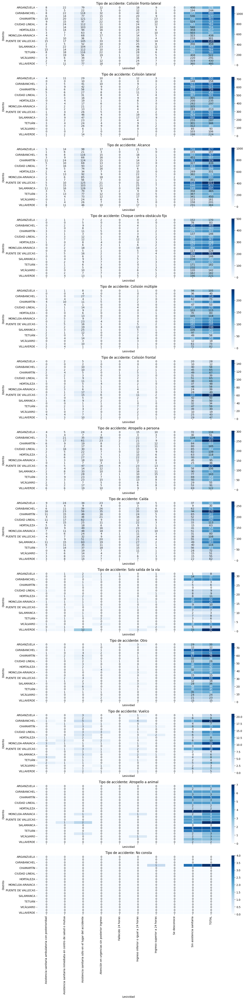

In [47]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# ============================================================
# 1. Lista completa de distritos (ordenada para consistencia)
# ============================================================
todos_distritos = sorted(df_accidentes_2024_copy_univariante["distrito"].unique())

# ============================================================
# 2. Lista de tipos de accidente
# ============================================================
tipos = df_accidentes_2024_copy_univariante["tipo_accidente"].unique()

# ============================================================
# 3. Configurar FacetGrid manual con subplots
# ============================================================
fig, axes = plt.subplots(
    nrows=len(tipos),
    ncols=1,
    figsize=(14, 4 * len(tipos)),
    sharex=True
)

if len(tipos) == 1:
    axes = [axes]  # asegurar iterabilidad

# ============================================================
# 4. Loop por tipo de accidente
# ============================================================
for ax, tipo in zip(axes, tipos):

    # Pivot por distrito × lesividad
    tabla_tipo = (
        df_accidentes_2024_copy_univariante
        [df_accidentes_2024_copy_univariante["tipo_accidente"] == tipo]
        .pivot_table(
            index="distrito",
            columns="lesividad",
            values="num_expediente",
            aggfunc="count",
            fill_value=0
        )
    )

    # ============================================================
    # 🔥 Reindexar para que aparezcan TODOS los distritos
    # ============================================================
    tabla_tipo = tabla_tipo.reindex(todos_distritos, fill_value=0)

    # ============================================================
    # 🔥 Añadir columna TOTAL = suma real de la fila
    # ============================================================
    tabla_tipo["TOTAL"] = tabla_tipo.sum(axis=1)

    # ============================================================
    # 5. Dibujar heatmap
    # ============================================================
    sns.heatmap(
        tabla_tipo,
        cmap="Blues",
        annot=True,
        fmt="d",
        linewidths=.5,
        ax=ax
    )

    ax.set_title(f"Tipo de accidente: {tipo}")
    ax.set_xlabel("Lesividad")
    ax.set_ylabel("Distrito")

# ============================================================
# 6. Ajuste final
# ============================================================
plt.tight_layout()
plt.show()


C:\Users\César\AppData\Local\Temp\ipykernel_30064\3210192943.py:37: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  .pivot_table(


ValueError: Unknown format code 'd' for object of type 'float'

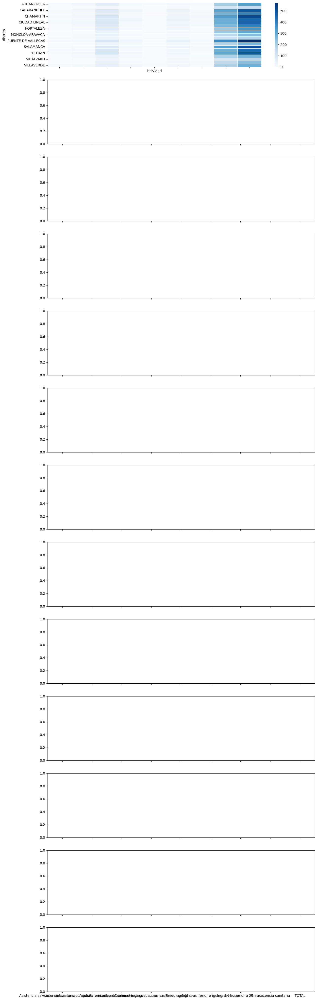

In [48]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# ============================================================
# 1. Lista completa de distritos (ordenada para consistencia)
# ============================================================
todos_distritos = sorted(df_accidentes_2024_copy_univariante["distrito"].unique())

# ============================================================
# 2. Lista de tipos de accidente
# ============================================================
tipos = df_accidentes_2024_copy_univariante["tipo_accidente"].unique()

# ============================================================
# 3. Configurar FacetGrid manual con subplots
# ============================================================
fig, axes = plt.subplots(
    nrows=len(tipos),
    ncols=1,
    figsize=(14, 4 * len(tipos)),
    sharex=True
)

if len(tipos) == 1:
    axes = [axes]  # asegurar iterabilidad

# ============================================================
# 4. Loop por tipo de accidente
# ============================================================
for ax, tipo in zip(axes, tipos):

    # Pivot por distrito × lesividad usando expedientes ÚNICOS
    tabla_tipo = (
        df_accidentes_2024_copy_univariante
        [df_accidentes_2024_copy_univariante["tipo_accidente"] == tipo]
        .pivot_table(
            index="distrito",
            columns="lesividad",
            values="num_expediente",
            aggfunc=lambda x: x.nunique(),   # 🔥 clave: expedientes únicos
            fill_value=0
        )
    )

    # ============================================================
    # 🔥 Reindexar para que aparezcan TODOS los distritos
    # ============================================================
    tabla_tipo = tabla_tipo.reindex(todos_distritos, fill_value=0)

    # ============================================================
    # 🔥 Añadir columna TOTAL = suma real de expedientes únicos
    # ============================================================
    tabla_tipo["TOTAL"] = tabla_tipo.sum(axis=1)

    # ============================================================
    # 5. Dibujar heatmap
    # ============================================================
    sns.heatmap(
        tabla_tipo,
        cmap="Blues",
        annot=True,
        fmt="d",
        linewidths=.5,
        ax=ax
    )

    ax.set_title(f"Tipo de accidente: {tipo}")
    ax.set_xlabel("Lesividad")
    ax.set_ylabel("Distrito")

# ============================================================
# 6. Ajuste final
# ============================================================
plt.tight_layout()
plt.show()


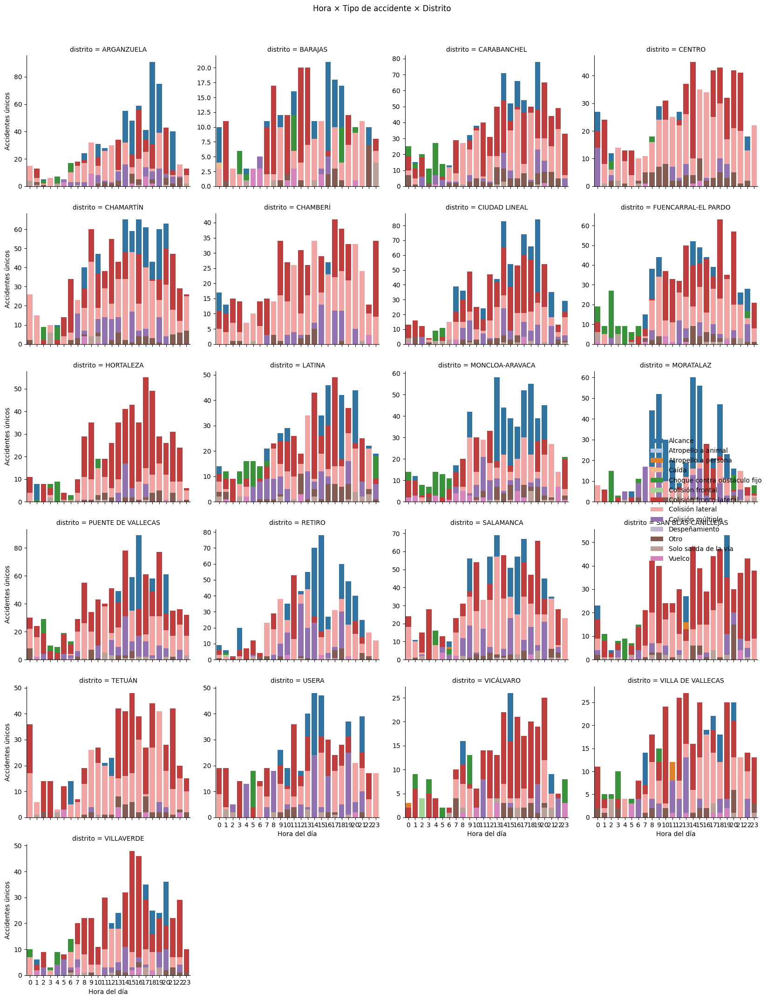

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt

# Asegurar columna hora_num
df_accidentes_2025_copy_univariante["hora_num"] = (
    df_accidentes_2025_copy_univariante["fecha_hora"].dt.hour
)

# Crear FacetGrid: un gráfico por distrito
g = sns.FacetGrid(
    df_accidentes_2025_copy_univariante,
    col="distrito",
    col_wrap=4,
    height=3.5,
    sharey=False
)

g.map_dataframe(
    sns.countplot,
    x="hora_num",
    hue="tipo_accidente",
    palette="tab20",
    dodge=False
)

g.add_legend()
g.set_axis_labels("Hora del día", "Accidentes únicos")
g.fig.suptitle("Hora × Tipo de accidente × Distrito", y=1.02)

plt.tight_layout()
plt.show()


## 2024

- Primero cargamos el dataset de acccidentalidad de madrid del año 2024:

In [13]:
df_accidentes_2024 = pd.read_csv(
    "./data/2024_Accidentalidad.csv",
    sep=";",
    skip_blank_lines=True,
    on_bad_lines="skip",
    encoding="utf-8"
)



Ahora tambien quiero ver sus dimensiones, es decir cuantas filas y columnas tiene el Dataset

In [14]:
df_accidentes_2024.shape

(49340, 19)

-Aqui observamos que tiene 19 columnas igual que 2025 y tiene 49340 filas

Ahora para el formato real de los datos y detectar valores a simple vista

In [15]:
df_accidentes_2024.head()

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga
0,2023S040280,04/01/2024,14:09:00,AVDA. NICETO ALCALA ZAMORA / AUTOV. M-11,3,16,HORTALEZA,Colisión fronto-lateral,Lluvia débil,Motocicleta > 125cc,Conductor,De 55 a 59 años,Hombre,2.0,Ingreso inferior o igual a 24 horas,444913.0,4481427.0,N,NaN
1,2023S040280,04/01/2024,14:09:00,AVDA. NICETO ALCALA ZAMORA / AUTOV. M-11,3,16,HORTALEZA,Colisión fronto-lateral,Lluvia débil,Turismo,Conductor,De 55 a 59 años,Mujer,14.0,Sin asistencia sanitaria,444913.0,4481427.0,N,NaN
2,2023S040309,15/02/2024,14:05:00,CALL. TESORO / CALL. MINAS,18,1,CENTRO,Colisión fronto-lateral,Lluvia débil,Bicicleta,Conductor,De 25 a 29 años,Hombre,7.0,Asistencia sanitaria sólo en el lugar del acci...,440123.0,4475170.0,N,NaN
3,2023S040309,15/02/2024,14:05:00,CALL. TESORO / CALL. MINAS,18,1,CENTRO,Colisión fronto-lateral,Lluvia débil,Motocicleta hasta 125cc,Conductor,De 35 a 39 años,Hombre,14.0,Sin asistencia sanitaria,440123.0,4475170.0,N,NaN
4,2023S040310,18/02/2024,10:40:00,GTA. RUIZ JIMENEZ / CALL. SAN BERNARDO,3,7,CHAMBERÍ,Colisión lateral,Despejado,Turismo,Conductor,De 25 a 29 años,Hombre,NaN,NaN,440137.0,4475721.0,N,NaN


In [16]:
df_accidentes_2024.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49340 entries, 0 to 49339
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   num_expediente        49340 non-null  object 
 1   fecha                 49340 non-null  object 
 2   hora                  49340 non-null  object 
 3   localizacion          49340 non-null  object 
 4   numero                49340 non-null  object 
 5   cod_distrito          49340 non-null  int64  
 6   distrito              49340 non-null  object 
 7   tipo_accidente        49335 non-null  object 
 8   estado_meteorológico  43424 non-null  object 
 9   tipo_vehiculo         48946 non-null  object 
 10  tipo_persona          49340 non-null  object 
 11  rango_edad            49340 non-null  object 
 12  sexo                  49340 non-null  object 
 13  cod_lesividad         27344 non-null  float64
 14  lesividad             27344 non-null  object 
 15  coordenada_x_utm   

Aqui procedemos hacer una copia del dataset para dejar el original tal cual y poder ver diferencias a la hora de limpiar y demas.

In [17]:
df_accidentes_2024_copy=df_accidentes_2024.copy()

Vamos a generar una tabla para ver los nulos y la cardinalidad de las diferentes variables que nos ayudaran a tomar decisiones con cada variable.
- La cardinalidad de las diferentes variables para decidir cuales son categoricas o no. Se calcula de la siguiente manera: 
$$Cardinalidad(<Columna/Característica>) = \dfrac{NúmerodeValoresUnicos(<Columna/Característica>)}{NúmeroTotalDeRegistros}* 100\%$$

In [18]:
# Número de nulos 
nulos = df_accidentes_2024_copy.isna().sum() 
# Porcentaje de nulos 
nulos_pct = (nulos / len(df_accidentes_2024_copy) * 100).round(2) 
# Cardinalidad 
card = df_accidentes_2024_copy.nunique() 
# Porcentaje de cardinalidad 
card_pct = (card / len(df_accidentes_2024_copy) * 100).round(2) 
# Tipo de dato 
tipos = df_accidentes_2024_copy.dtypes 
#Construcción de la tabla 
tabla_eda = pd.DataFrame({ 
    "nulos": nulos,
    "% nulos": nulos_pct,
    "cardinalidad": card, 
    "% cardinalidad": card_pct,
    "tipo": tipos }) 
# Ordenar por cardinalidad (o por nulos si prefieres) 
tabla_eda = tabla_eda.sort_values("cardinalidad", ascending=False) 
tabla_eda

,nulos,% nulos,cardinalidad,% cardinalidad,tipo
num_expediente,0,0.00,20698,41.95,object
localizacion,0,0.00,15131,30.67,object
coordenada_y_utm,6,0.01,10997,22.29,float64
coordenada_x_utm,6,0.01,10131,20.53,float64
numero,0,0.00,1759,3.57,object
hora,0,0.00,1256,2.55,object
fecha,0,0.00,366,0.74,object
tipo_vehiculo,394,0.80,32,0.06,object
cod_distrito,0,0.00,21,0.04,int64
distrito,0,0.00,21,0.04,object


In [19]:
df_accidentes_2024_copy["fecha"] = pd.to_datetime(df_accidentes_2024_copy["fecha"], errors="coerce", dayfirst=True) 
df_accidentes_2024_copy["hora"] = pd.to_datetime(df_accidentes_2024_copy["hora"], format="%H:%M:%S", errors="coerce").dt.time 
df_accidentes_2024_copy["fecha_hora"] = df_accidentes_2024_copy.apply( 
                            lambda row: pd.Timestamp.combine(row["fecha"], row["hora"])
                            if pd.notnull(row["fecha"]) and pd.notnull(row["hora"])
                            else pd.NaT,
                            axis=1 )

cols_string = ["num_expediente", "localizacion", "numero"] 
for col in cols_string: 
    df_accidentes_2024_copy[col] = df_accidentes_2024_copy[col].astype(str).str.lower().str.strip().str.replace(r"\s+", " ", regex=True)

In [20]:

# 1. ESTADO METEOROLÓGICO

if 'estado_meteorológico' in df_accidentes_2024_copy.columns:
    df_accidentes_2024_copy['estado_meteorológico'] = df_accidentes_2024_copy['estado_meteorológico'].fillna('No consta')

# 2. TIPO VEHÍCULO

if 'tipo_vehiculo' in df_accidentes_2024_copy.columns and 'tipo_persona' in df_accidentes_2024_copy.columns:

    # Peatón y testigo → No aplica
    mask_no_aplica = df_accidentes_2024_copy['tipo_persona'].str.lower().isin(['peatón', 'testigo'])
    df_accidentes_2024_copy.loc[
        mask_no_aplica & df_accidentes_2024_copy['tipo_vehiculo'].isna(),
        'tipo_vehiculo'
    ] = 'No aplica'

    # El resto de nulos → No consta
    df_accidentes_2024_copy['tipo_vehiculo'] = df_accidentes_2024_copy['tipo_vehiculo'].fillna('No consta')

# 3. LESIVIDAD (ORDINAL)

if 'cod_lesividad' in df_accidentes_2024_copy.columns:
    df_accidentes_2024_copy['cod_lesividad'] = df_accidentes_2024_copy['cod_lesividad'].fillna(14)

if 'lesividad' in df_accidentes_2024_copy.columns:
    df_accidentes_2024_copy['lesividad'] = df_accidentes_2024_copy['lesividad'].fillna('Sin asistencia sanitaria')

# 4. ALCOHOL Y DROGAS

if 'positiva_alcohol' in df_accidentes_2024_copy.columns:
    df_accidentes_2024_copy['positiva_alcohol'] = df_accidentes_2024_copy['positiva_alcohol'].fillna('No consta')

if 'positiva_droga' in df_accidentes_2024_copy.columns:
    df_accidentes_2024_copy['positiva_droga'] = df_accidentes_2024_copy['positiva_droga'].fillna('No consta')

# 5. NUMERO

if 'numero' in df_accidentes_2024_copy.columns:
    df_accidentes_2024_copy['numero'] = df_accidentes_2024_copy['numero'].fillna('No aplica')
    
# 6. TIPO DE ACCIDENTE 
if 'tipo_accidente' in df_accidentes_2024_copy.columns:
    df_accidentes_2024_copy['tipo_accidente'] = df_accidentes_2024_copy['tipo_accidente'].fillna('No consta')


In [21]:
# 6. CONVERTIR A CATEGORY (DESPUÉS DE IMPUTAR) 
cols_category = [ 'estado_meteorológico', 
                 'tipo_vehiculo', 
                 'tipo_persona', 
                 'tipo_accidente', 
                 'distrito', 
                 'cod_distrito', 
                 'rango_edad', 
                 'sexo', 
                 'cod_lesividad', 
                 'lesividad', 
                 'positiva_alcohol', 
                 'positiva_droga' 
                 ] 
for col in cols_category: 
    df_accidentes_2024_copy[col] = df_accidentes_2024_copy[col].astype('category')

In [22]:
df_accidentes_2024_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49340 entries, 0 to 49339
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   num_expediente        49340 non-null  object        
 1   fecha                 49340 non-null  datetime64[ns]
 2   hora                  49340 non-null  object        
 3   localizacion          49340 non-null  object        
 4   numero                49340 non-null  object        
 5   cod_distrito          49340 non-null  category      
 6   distrito              49340 non-null  category      
 7   tipo_accidente        49340 non-null  category      
 8   estado_meteorológico  49340 non-null  category      
 9   tipo_vehiculo         49340 non-null  category      
 10  tipo_persona          49340 non-null  category      
 11  rango_edad            49340 non-null  category      
 12  sexo                  49340 non-null  category      
 13  cod_lesividad   

- Faltan 2023, 2022, 2021 y 2020

## Analisis Univariante de 2025 

In [20]:
# Ver qué meses aparecen realmente en el dataset
print(df_accidentes_2025_copy['mes'].unique())

# Contar accidentes por mes
print(df_accidentes_2025_copy['mes'].value_counts().sort_index())


[ 1  2  3  4  5  6  7  8  9 10]
mes
1     4085
2     3813
3     4607
4     4214
5     4376
6     4439
7     4118
8     2672
9     4402
10    5004
Name: count, dtype: int64


In [70]:
df_accidentes_2024_copy=df_accidentes_2024.copy()

#La colmna de la fecha la paso a datatime:

df_accidentes_2024_copy["fecha"] = pd.to_datetime(df_accidentes_2024_copy["fecha"], errors="coerce", dayfirst=True)

#Aqui convierto la columna localizacion a string:

df_accidentes_2024_copy["localizacion"] = df_accidentes_2024_copy["localizacion"].astype(str)

#La coumna localizacion voy a pasarla a minuscula toda por si luego hacemos recuento de cuentas veces se repiten:

df_accidentes_2024_copy["localizacion"] = (
    df_accidentes_2024_copy["localizacion"]
    .str.lower()                       # minúsculas
    .str.strip()                       # quitar espacios extremos
    .str.replace(r"\s+", " ", regex=True)  # espacios múltiples → uno solo
)
df_accidentes_2024_copy["distrito"] = df_accidentes_2024_copy["distrito"].astype(str)

#La coumna localizacion voy a pasarla a minuscula toda por si luego hacemos recuento de cuentas veces se repiten:

df_accidentes_2024_copy["distrito"] = (
    df_accidentes_2024_copy["distrito"]
    .str.lower()                       # minúsculas
    .str.strip()                       # quitar espacios extremos
    .str.replace(r"\s+", " ", regex=True)  # espacios múltiples → uno solo
)
df_accidentes_2024_copy

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga
0,2023S040280,2024-01-04,14:09:00,avda. niceto alcala zamora / autov. m-11,3,16,hortaleza,Colisión fronto-lateral,Lluvia débil,Motocicleta > 125cc,Conductor,De 55 a 59 años,Hombre,2.0,Ingreso inferior o igual a 24 horas,444913.0,4481427.0,N,NaN
1,2023S040280,2024-01-04,14:09:00,avda. niceto alcala zamora / autov. m-11,3,16,hortaleza,Colisión fronto-lateral,Lluvia débil,Turismo,Conductor,De 55 a 59 años,Mujer,14.0,Sin asistencia sanitaria,444913.0,4481427.0,N,NaN
2,2023S040309,2024-02-15,14:05:00,call. tesoro / call. minas,18,1,centro,Colisión fronto-lateral,Lluvia débil,Bicicleta,Conductor,De 25 a 29 años,Hombre,7.0,Asistencia sanitaria sólo en el lugar del acci...,440123.0,4475170.0,N,NaN
3,2023S040309,2024-02-15,14:05:00,call. tesoro / call. minas,18,1,centro,Colisión fronto-lateral,Lluvia débil,Motocicleta hasta 125cc,Conductor,De 35 a 39 años,Hombre,14.0,Sin asistencia sanitaria,440123.0,4475170.0,N,NaN
4,2023S040310,2024-02-18,10:40:00,gta. ruiz jimenez / call. san bernardo,3,7,chamberí,Colisión lateral,Despejado,Turismo,Conductor,De 25 a 29 años,Hombre,NaN,NaN,440137.0,4475721.0,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49335,2024S035474,2024-12-23,11:35:00,call. lucano / call. canal del bosforo,1,20,san blas-canillejas,Otro,Despejado,Camión rígido,Conductor,De 25 a 29 años,Hombre,NaN,NaN,448109.0,4476801.0,N,NaN
49336,2024S035479,2024-12-03,9:45:00,gta. san vicente / avda. portugal,1,9,moncloa-aravaca,Otro,Despejado,Autobús,Conductor,De 40 a 44 años,Hombre,NaN,NaN,438883.0,4474597.0,N,NaN
49337,2024S035479,2024-12-03,9:45:00,gta. san vicente / avda. portugal,1,9,moncloa-aravaca,Otro,Despejado,Turismo,Conductor,De 50 a 54 años,Hombre,NaN,NaN,438883.0,4474597.0,N,NaN
49338,2024S035480,2024-12-29,19:15:00,plaza. cibeles / call. alcala,1,3,retiro,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 35 a 39 años,Hombre,NaN,NaN,441193.0,4474551.0,N,NaN


In [72]:
df_accidentes_2024_copy['hora'] = pd.to_datetime(df_accidentes_2024_copy['hora'], format='%H:%M:%S', errors='coerce').dt.time
#df_accidentes_copy['hora'].head() df_accidentes_copy['hora'].dtype # seguirá siendo object (datetime.time)

df_accidentes_2024_copy['fecha_hora'] = df_accidentes_2024_copy.apply( lambda row: pd.Timestamp.combine(row['fecha'], row['hora']) if pd.notnull(row['fecha']) and pd.notnull(row['hora']) else pd.NaT, axis=1 )


df_accidentes_2024_copy['numero'] = pd.to_numeric(df_accidentes_2024_copy['numero'], errors='coerce') 
df_accidentes_2024_copy['positiva_alcohol'] = df_accidentes_2024_copy['positiva_alcohol'].map({'S':1, 'N':0}) 
df_accidentes_2024_copy['positiva_droga'] = df_accidentes_2024_copy['positiva_droga'].fillna(0).astype(int)

df_accidentes_2024_copy

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga,fecha_hora
0,2023S040280,2024-01-04,00:49:00,avda. niceto alcala zamora / autov. m-11,3.0,16,hortaleza,Colisión fronto-lateral,Lluvia débil,Motocicleta > 125cc,Conductor,De 55 a 59 años,Hombre,2.0,Ingreso inferior o igual a 24 horas,444913.0,4481427.0,NaN,0,2024-01-04 00:49:00
1,2023S040280,2024-01-04,00:49:00,avda. niceto alcala zamora / autov. m-11,3.0,16,hortaleza,Colisión fronto-lateral,Lluvia débil,Turismo,Conductor,De 55 a 59 años,Mujer,14.0,Sin asistencia sanitaria,444913.0,4481427.0,NaN,0,2024-01-04 00:49:00
2,2023S040309,2024-02-15,00:49:00,call. tesoro / call. minas,18.0,1,centro,Colisión fronto-lateral,Lluvia débil,Bicicleta,Conductor,De 25 a 29 años,Hombre,7.0,Asistencia sanitaria sólo en el lugar del acci...,440123.0,4475170.0,NaN,0,2024-02-15 00:49:00
3,2023S040309,2024-02-15,02:20:00,call. tesoro / call. minas,18.0,1,centro,Colisión fronto-lateral,Lluvia débil,Motocicleta hasta 125cc,Conductor,De 35 a 39 años,Hombre,14.0,Sin asistencia sanitaria,440123.0,4475170.0,NaN,0,2024-02-15 02:20:00
4,2023S040310,2024-02-18,02:20:00,gta. ruiz jimenez / call. san bernardo,3.0,7,chamberí,Colisión lateral,Despejado,Turismo,Conductor,De 25 a 29 años,Hombre,NaN,NaN,440137.0,4475721.0,NaN,0,2024-02-18 02:20:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49335,2024S035474,2024-12-23,NaT,call. lucano / call. canal del bosforo,1.0,20,san blas-canillejas,Otro,Despejado,Camión rígido,Conductor,De 25 a 29 años,Hombre,NaN,NaN,448109.0,4476801.0,NaN,0,NaT
49336,2024S035479,2024-12-03,NaT,gta. san vicente / avda. portugal,1.0,9,moncloa-aravaca,Otro,Despejado,Autobús,Conductor,De 40 a 44 años,Hombre,NaN,NaN,438883.0,4474597.0,NaN,0,NaT
49337,2024S035479,2024-12-03,NaT,gta. san vicente / avda. portugal,1.0,9,moncloa-aravaca,Otro,Despejado,Turismo,Conductor,De 50 a 54 años,Hombre,NaN,NaN,438883.0,4474597.0,NaN,0,NaT
49338,2024S035480,2024-12-29,NaT,plaza. cibeles / call. alcala,1.0,3,retiro,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 35 a 39 años,Hombre,NaN,NaN,441193.0,4474551.0,NaN,0,NaT


In [73]:
df_accidentes_2024_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49340 entries, 0 to 49339
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   num_expediente        49340 non-null  object        
 1   fecha                 49340 non-null  datetime64[ns]
 2   hora                  41730 non-null  object        
 3   localizacion          49340 non-null  object        
 4   numero                42676 non-null  float64       
 5   cod_distrito          49340 non-null  int64         
 6   distrito              49340 non-null  object        
 7   tipo_accidente        49335 non-null  object        
 8   estado_meteorológico  43424 non-null  object        
 9   tipo_vehiculo         48946 non-null  object        
 10  tipo_persona          49340 non-null  object        
 11  rango_edad            49340 non-null  object        
 12  sexo                  49340 non-null  object        
 13  cod_lesividad   

In [74]:
# 1. estado_meteorológico 

df_accidentes_2024_copy['estado_meteorológico'] = df_accidentes_2024_copy['estado_meteorológico'].fillna('No consta') 

# # 2. tipo_vehiculo

mask_no_aplica = df_accidentes_2024_copy['tipo_persona'].str.lower().isin(['peatón', 'testigo']) 

df_accidentes_2024_copy.loc[mask_no_aplica & df_accidentes_2024_copy['tipo_vehiculo'].isna(), 'tipo_vehiculo'] = 'No aplica' 


# Rellenar el resto de nulos con "No consta" 

df_accidentes_2024_copy['tipo_vehiculo'] = df_accidentes_2024_copy['tipo_vehiculo'].fillna('No consta')

# 3. Lesividad 

df_accidentes_2024_copy['cod_lesividad'] = df_accidentes_2024_copy['cod_lesividad'].fillna(14) 

df_accidentes_2024_copy['lesividad'] = df_accidentes_2024_copy['lesividad'].fillna('Sin asistencia sanitaria') 

# 4. Alcohol y drogas 

df_accidentes_2024_copy['positiva_alcohol'] = df_accidentes_2024_copy['positiva_alcohol'].fillna('No consta') 

df_accidentes_2024_copy['positiva_droga'] = df_accidentes_2024_copy['positiva_droga'].fillna('No consta')

In [75]:
df_accidentes_2024_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49340 entries, 0 to 49339
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   num_expediente        49340 non-null  object        
 1   fecha                 49340 non-null  datetime64[ns]
 2   hora                  41730 non-null  object        
 3   localizacion          49340 non-null  object        
 4   numero                42676 non-null  float64       
 5   cod_distrito          49340 non-null  int64         
 6   distrito              49340 non-null  object        
 7   tipo_accidente        49335 non-null  object        
 8   estado_meteorológico  49340 non-null  object        
 9   tipo_vehiculo         49340 non-null  object        
 10  tipo_persona          49340 non-null  object        
 11  rango_edad            49340 non-null  object        
 12  sexo                  49340 non-null  object        
 13  cod_lesividad   

- Tratamiento 2023

In [23]:
df_accidentes_2023 = pd.read_csv(
    "./data/2023_Accidentalidad.csv",
    sep=";",
    skip_blank_lines=True,
    on_bad_lines="skip",
    encoding="utf-8"
)
df_accidentes_2023

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga
0,2023S000001,01/01/2023,1:15:00,"AVDA. ALFONSO XIII, 33",33,5.0,CHAMARTÍN,Alcance,Despejado,Todo terreno,Conductor,De 55 a 59 años,Mujer,14.0,Sin asistencia sanitaria,443397.0,4478129.0,N,NaN
1,2023S000001,01/01/2023,1:15:00,"AVDA. ALFONSO XIII, 33",33,5.0,CHAMARTÍN,Alcance,Despejado,Todo terreno,Pasajero,De 21 a 24 años,Hombre,14.0,Sin asistencia sanitaria,443397.0,4478129.0,N,NaN
2,2023S000001,01/01/2023,1:15:00,"AVDA. ALFONSO XIII, 33",33,5.0,CHAMARTÍN,Alcance,Despejado,Todo terreno,Pasajero,De 21 a 24 años,Hombre,14.0,Sin asistencia sanitaria,443397.0,4478129.0,N,NaN
3,2023S000001,01/01/2023,1:15:00,"AVDA. ALFONSO XIII, 33",33,5.0,CHAMARTÍN,Alcance,Despejado,Todo terreno,Pasajero,De 21 a 24 años,Mujer,7.0,Asistencia sanitaria sólo en el lugar del acci...,443397.0,4478129.0,N,NaN
4,2023S000001,01/01/2023,1:15:00,"AVDA. ALFONSO XIII, 33",33,5.0,CHAMARTÍN,Alcance,Despejado,Todo terreno,Pasajero,De 55 a 59 años,Hombre,7.0,Asistencia sanitaria sólo en el lugar del acci...,443397.0,4478129.0,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48825,2023S040267,31/12/2023,21:15:00,AVDA. GRAN VIA DE VILLAVERDE / AVDA. ANDALUCIA,10,17.0,VILLAVERDE,Colisión fronto-lateral,Despejado,Turismo,Pasajero,De 45 a 49 años,Mujer,7.0,Asistencia sanitaria sólo en el lugar del acci...,441152.0,4466350.0,N,NaN
48826,2023S040267,31/12/2023,21:15:00,AVDA. GRAN VIA DE VILLAVERDE / AVDA. ANDALUCIA,10,17.0,VILLAVERDE,Colisión fronto-lateral,Despejado,Turismo,Pasajero,De 6 a 9 años,Hombre,7.0,Asistencia sanitaria sólo en el lugar del acci...,441152.0,4466350.0,N,NaN
48827,2023S040277,29/12/2023,9:35:00,"PTA. TOLEDO, 0",0,1.0,CENTRO,Alcance,Despejado,Motocicleta hasta 125cc,Conductor,De 45 a 49 años,Hombre,NaN,NaN,439594.0,4473163.0,N,NaN
48828,2023S040277,29/12/2023,9:35:00,"PTA. TOLEDO, 0",0,1.0,CENTRO,Alcance,Despejado,Turismo,Conductor,De 21 a 24 años,Hombre,NaN,NaN,439594.0,4473163.0,N,NaN


In [24]:
df_accidentes_2023.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48830 entries, 0 to 48829
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   num_expediente        48830 non-null  object 
 1   fecha                 48830 non-null  object 
 2   hora                  48830 non-null  object 
 3   localizacion          48830 non-null  object 
 4   numero                48827 non-null  object 
 5   cod_distrito          48827 non-null  float64
 6   distrito              48827 non-null  object 
 7   tipo_accidente        48830 non-null  object 
 8   estado_meteorológico  43127 non-null  object 
 9   tipo_vehiculo         48452 non-null  object 
 10  tipo_persona          48830 non-null  object 
 11  rango_edad            48830 non-null  object 
 12  sexo                  48830 non-null  object 
 13  cod_lesividad         25945 non-null  float64
 14  lesividad             25945 non-null  object 
 15  coordenada_x_utm   

In [25]:
df_accidentes_2023_copy=df_accidentes_2023.copy()

#La colmna de la fecha la paso a datatime:

df_accidentes_2023_copy["fecha"] = pd.to_datetime(df_accidentes_2023_copy["fecha"], errors="coerce", dayfirst=True)

#Aqui convierto la columna localizacion a string:

df_accidentes_2023_copy["localizacion"] = df_accidentes_2023_copy["localizacion"].astype(str)

#La coumna localizacion voy a pasarla a minuscula toda por si luego hacemos recuento de cuentas veces se repiten:

df_accidentes_2023_copy["localizacion"] = (
    df_accidentes_2023_copy["localizacion"]
    .str.lower()                       # minúsculas
    .str.strip()                       # quitar espacios extremos
    .str.replace(r"\s+", " ", regex=True)  # espacios múltiples → uno solo
)
df_accidentes_2023_copy["distrito"] = df_accidentes_2023_copy["distrito"].astype(str)

#La coumna localizacion voy a pasarla a minuscula toda por si luego hacemos recuento de cuentas veces se repiten:

df_accidentes_2023_copy["distrito"] = (
    df_accidentes_2023_copy["distrito"]
    .str.lower()                       # minúsculas
    .str.strip()                       # quitar espacios extremos
    .str.replace(r"\s+", " ", regex=True)  # espacios múltiples → uno solo
)
df_accidentes_2023_copy

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga
0,2023S000001,2023-01-01,1:15:00,"avda. alfonso xiii, 33",33,5.0,chamartín,Alcance,Despejado,Todo terreno,Conductor,De 55 a 59 años,Mujer,14.0,Sin asistencia sanitaria,443397.0,4478129.0,N,NaN
1,2023S000001,2023-01-01,1:15:00,"avda. alfonso xiii, 33",33,5.0,chamartín,Alcance,Despejado,Todo terreno,Pasajero,De 21 a 24 años,Hombre,14.0,Sin asistencia sanitaria,443397.0,4478129.0,N,NaN
2,2023S000001,2023-01-01,1:15:00,"avda. alfonso xiii, 33",33,5.0,chamartín,Alcance,Despejado,Todo terreno,Pasajero,De 21 a 24 años,Hombre,14.0,Sin asistencia sanitaria,443397.0,4478129.0,N,NaN
3,2023S000001,2023-01-01,1:15:00,"avda. alfonso xiii, 33",33,5.0,chamartín,Alcance,Despejado,Todo terreno,Pasajero,De 21 a 24 años,Mujer,7.0,Asistencia sanitaria sólo en el lugar del acci...,443397.0,4478129.0,N,NaN
4,2023S000001,2023-01-01,1:15:00,"avda. alfonso xiii, 33",33,5.0,chamartín,Alcance,Despejado,Todo terreno,Pasajero,De 55 a 59 años,Hombre,7.0,Asistencia sanitaria sólo en el lugar del acci...,443397.0,4478129.0,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48825,2023S040267,2023-12-31,21:15:00,avda. gran via de villaverde / avda. andalucia,10,17.0,villaverde,Colisión fronto-lateral,Despejado,Turismo,Pasajero,De 45 a 49 años,Mujer,7.0,Asistencia sanitaria sólo en el lugar del acci...,441152.0,4466350.0,N,NaN
48826,2023S040267,2023-12-31,21:15:00,avda. gran via de villaverde / avda. andalucia,10,17.0,villaverde,Colisión fronto-lateral,Despejado,Turismo,Pasajero,De 6 a 9 años,Hombre,7.0,Asistencia sanitaria sólo en el lugar del acci...,441152.0,4466350.0,N,NaN
48827,2023S040277,2023-12-29,9:35:00,"pta. toledo, 0",0,1.0,centro,Alcance,Despejado,Motocicleta hasta 125cc,Conductor,De 45 a 49 años,Hombre,NaN,NaN,439594.0,4473163.0,N,NaN
48828,2023S040277,2023-12-29,9:35:00,"pta. toledo, 0",0,1.0,centro,Alcance,Despejado,Turismo,Conductor,De 21 a 24 años,Hombre,NaN,NaN,439594.0,4473163.0,N,NaN


In [26]:
df_accidentes_2023_copy['hora'] = pd.to_datetime(df_accidentes_2023_copy['hora'], format='%H:%M:%S', errors='coerce').dt.time
#df_accidentes_copy['hora'].head() df_accidentes_copy['hora'].dtype # seguirá siendo object (datetime.time)

df_accidentes_2023_copy['fecha_hora'] = df_accidentes_2023_copy.apply( lambda row: pd.Timestamp.combine(row['fecha'], row['hora']) if pd.notnull(row['fecha']) and pd.notnull(row['hora']) else pd.NaT, axis=1 )


df_accidentes_2023_copy['numero'] = pd.to_numeric(df_accidentes_2023_copy['numero'], errors='coerce') 
df_accidentes_2023_copy['positiva_alcohol'] = df_accidentes_2023_copy['positiva_alcohol'].map({'S':1, 'N':0}) 
df_accidentes_2023_copy['positiva_droga'] = df_accidentes_2023_copy['positiva_droga'].fillna(0).astype(int)

df_accidentes_2023_copy

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga,fecha_hora
0,2023S000001,2023-01-01,01:15:00,"avda. alfonso xiii, 33",33.0,5.0,chamartín,Alcance,Despejado,Todo terreno,Conductor,De 55 a 59 años,Mujer,14.0,Sin asistencia sanitaria,443397.0,4478129.0,0.0,0,2023-01-01 01:15:00
1,2023S000001,2023-01-01,01:15:00,"avda. alfonso xiii, 33",33.0,5.0,chamartín,Alcance,Despejado,Todo terreno,Pasajero,De 21 a 24 años,Hombre,14.0,Sin asistencia sanitaria,443397.0,4478129.0,0.0,0,2023-01-01 01:15:00
2,2023S000001,2023-01-01,01:15:00,"avda. alfonso xiii, 33",33.0,5.0,chamartín,Alcance,Despejado,Todo terreno,Pasajero,De 21 a 24 años,Hombre,14.0,Sin asistencia sanitaria,443397.0,4478129.0,0.0,0,2023-01-01 01:15:00
3,2023S000001,2023-01-01,01:15:00,"avda. alfonso xiii, 33",33.0,5.0,chamartín,Alcance,Despejado,Todo terreno,Pasajero,De 21 a 24 años,Mujer,7.0,Asistencia sanitaria sólo en el lugar del acci...,443397.0,4478129.0,0.0,0,2023-01-01 01:15:00
4,2023S000001,2023-01-01,01:15:00,"avda. alfonso xiii, 33",33.0,5.0,chamartín,Alcance,Despejado,Todo terreno,Pasajero,De 55 a 59 años,Hombre,7.0,Asistencia sanitaria sólo en el lugar del acci...,443397.0,4478129.0,0.0,0,2023-01-01 01:15:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48825,2023S040267,2023-12-31,21:15:00,avda. gran via de villaverde / avda. andalucia,10.0,17.0,villaverde,Colisión fronto-lateral,Despejado,Turismo,Pasajero,De 45 a 49 años,Mujer,7.0,Asistencia sanitaria sólo en el lugar del acci...,441152.0,4466350.0,0.0,0,2023-12-31 21:15:00
48826,2023S040267,2023-12-31,21:15:00,avda. gran via de villaverde / avda. andalucia,10.0,17.0,villaverde,Colisión fronto-lateral,Despejado,Turismo,Pasajero,De 6 a 9 años,Hombre,7.0,Asistencia sanitaria sólo en el lugar del acci...,441152.0,4466350.0,0.0,0,2023-12-31 21:15:00
48827,2023S040277,2023-12-29,09:35:00,"pta. toledo, 0",0.0,1.0,centro,Alcance,Despejado,Motocicleta hasta 125cc,Conductor,De 45 a 49 años,Hombre,NaN,NaN,439594.0,4473163.0,0.0,0,2023-12-29 09:35:00
48828,2023S040277,2023-12-29,09:35:00,"pta. toledo, 0",0.0,1.0,centro,Alcance,Despejado,Turismo,Conductor,De 21 a 24 años,Hombre,NaN,NaN,439594.0,4473163.0,0.0,0,2023-12-29 09:35:00


In [27]:
df_accidentes_2023_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48830 entries, 0 to 48829
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   num_expediente        48830 non-null  object        
 1   fecha                 48830 non-null  datetime64[ns]
 2   hora                  48830 non-null  object        
 3   localizacion          48830 non-null  object        
 4   numero                42446 non-null  float64       
 5   cod_distrito          48827 non-null  float64       
 6   distrito              48830 non-null  object        
 7   tipo_accidente        48830 non-null  object        
 8   estado_meteorológico  43127 non-null  object        
 9   tipo_vehiculo         48452 non-null  object        
 10  tipo_persona          48830 non-null  object        
 11  rango_edad            48830 non-null  object        
 12  sexo                  48830 non-null  object        
 13  cod_lesividad   

In [28]:
# 1. estado_meteorológico 

df_accidentes_2023_copy['estado_meteorológico'] = df_accidentes_2023_copy['estado_meteorológico'].fillna('No consta') 

# # 2. tipo_vehiculo

mask_no_aplica = df_accidentes_2023_copy['tipo_persona'].str.lower().isin(['peatón', 'testigo']) 

df_accidentes_2023_copy.loc[mask_no_aplica & df_accidentes_2023_copy['tipo_vehiculo'].isna(), 'tipo_vehiculo'] = 'No aplica' 


# Rellenar el resto de nulos con "No consta" 

df_accidentes_2023_copy['tipo_vehiculo'] = df_accidentes_2023_copy['tipo_vehiculo'].fillna('No consta')

# 3. Lesividad 

df_accidentes_2023_copy['cod_lesividad'] = df_accidentes_2023_copy['cod_lesividad'].fillna(14) 

df_accidentes_2023_copy['lesividad'] = df_accidentes_2023_copy['lesividad'].fillna('Sin asistencia sanitaria') 

# 4. Alcohol y drogas 

df_accidentes_2023_copy['positiva_alcohol'] = df_accidentes_2023_copy['positiva_alcohol'].fillna('No consta') 

df_accidentes_2023_copy['positiva_droga'] = df_accidentes_2023_copy['positiva_droga'].fillna('No consta')

In [29]:
df_accidentes_2023_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48830 entries, 0 to 48829
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   num_expediente        48830 non-null  object        
 1   fecha                 48830 non-null  datetime64[ns]
 2   hora                  48830 non-null  object        
 3   localizacion          48830 non-null  object        
 4   numero                42446 non-null  float64       
 5   cod_distrito          48827 non-null  float64       
 6   distrito              48830 non-null  object        
 7   tipo_accidente        48830 non-null  object        
 8   estado_meteorológico  48830 non-null  object        
 9   tipo_vehiculo         48830 non-null  object        
 10  tipo_persona          48830 non-null  object        
 11  rango_edad            48830 non-null  object        
 12  sexo                  48830 non-null  object        
 13  cod_lesividad   

- Tratamiento 2022

In [30]:
df_accidentes_2022 = pd.read_csv(
    "./data/2022_Accidentalidad.csv",
    sep=";",
    skip_blank_lines=True,
    on_bad_lines="skip",
    encoding="utf-8"
)
df_accidentes_2022

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga
0,2022S000001,01/01/2022,1:30:00,"AVDA. ALBUFERA, 19",19,13,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,Conductor,De 30 a 34 años,Mujer,NaN,NaN,443359.0,4472082.0,N,NaN
1,2022S000001,01/01/2022,1:30:00,"AVDA. ALBUFERA, 19",19,13,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,Conductor,De 45 a 49 años,Hombre,NaN,NaN,443359.0,4472082.0,N,NaN
2,2022S000002,01/01/2022,0:30:00,PLAZA. CANOVAS DEL CASTILLO / PASEO. PRADO,2,3,RETIRO,Colisión fronto-lateral,NaN,Motocicleta hasta 125cc,Conductor,De 30 a 34 años,Hombre,NaN,NaN,441155.0,4474129.0,S,NaN
3,2022S000002,01/01/2022,0:30:00,PLAZA. CANOVAS DEL CASTILLO / PASEO. PRADO,2,3,RETIRO,Colisión fronto-lateral,NaN,Motocicleta hasta 125cc,Pasajero,De 35 a 39 años,Mujer,NaN,NaN,441155.0,4474129.0,N,NaN
4,2022S000002,01/01/2022,0:30:00,PLAZA. CANOVAS DEL CASTILLO / PASEO. PRADO,2,3,RETIRO,Colisión fronto-lateral,NaN,Turismo,Conductor,De 40 a 44 años,Hombre,NaN,NaN,441155.0,4474129.0,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47048,2022S041289,29/12/2022,19:40:00,CALL. GENERAL RICARDOS / plaza de toros,174,11,CARABANCHEL,Alcance,Despejado,Turismo,Conductor,De 50 a 54 años,Hombre,14.0,Sin asistencia sanitaria,437453.0,4470784.0,N,NaN
47049,2022S041289,29/12/2022,19:40:00,CALL. GENERAL RICARDOS / plaza de toros,174,11,CARABANCHEL,Alcance,Despejado,Turismo,Pasajero,De 50 a 54 años,Mujer,7.0,Asistencia sanitaria sólo en el lugar del acci...,437453.0,4470784.0,N,NaN
47050,2022S041312,12/12/2022,22:50:00,AVDA. ANDALUCIA / AVDA. PERLA,14,12,USERA,Colisión fronto-lateral,Lluvia débil,Turismo,Conductor,De 21 a 24 años,Mujer,NaN,NaN,441049.0,4469136.0,N,NaN
47051,2022S041312,12/12/2022,22:50:00,AVDA. ANDALUCIA / AVDA. PERLA,14,12,USERA,Colisión fronto-lateral,Lluvia débil,Turismo,Conductor,De 35 a 39 años,Hombre,NaN,NaN,441049.0,4469136.0,N,NaN


In [31]:
df_accidentes_2022_copy=df_accidentes_2022.copy()

#La colmna de la fecha la paso a datatime:

df_accidentes_2022_copy["fecha"] = pd.to_datetime(df_accidentes_2022_copy["fecha"], errors="coerce", dayfirst=True)

#Aqui convierto la columna localizacion a string:

df_accidentes_2022_copy["localizacion"] = df_accidentes_2022_copy["localizacion"].astype(str)

#La coumna localizacion voy a pasarla a minuscula toda por si luego hacemos recuento de cuentas veces se repiten:

df_accidentes_2022_copy["localizacion"] = (
    df_accidentes_2022_copy["localizacion"]
    .str.lower()                       # minúsculas
    .str.strip()                       # quitar espacios extremos
    .str.replace(r"\s+", " ", regex=True)  # espacios múltiples → uno solo
)
df_accidentes_2022_copy["distrito"] = df_accidentes_2022_copy["distrito"].astype(str)

#La coumna localizacion voy a pasarla a minuscula toda por si luego hacemos recuento de cuentas veces se repiten:

df_accidentes_2022_copy["distrito"] = (
    df_accidentes_2022_copy["distrito"]
    .str.lower()                       # minúsculas
    .str.strip()                       # quitar espacios extremos
    .str.replace(r"\s+", " ", regex=True)  # espacios múltiples → uno solo
)
df_accidentes_2022_copy

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga
0,2022S000001,2022-01-01,1:30:00,"avda. albufera, 19",19,13,puente de vallecas,Alcance,Despejado,Turismo,Conductor,De 30 a 34 años,Mujer,NaN,NaN,443359.0,4472082.0,N,NaN
1,2022S000001,2022-01-01,1:30:00,"avda. albufera, 19",19,13,puente de vallecas,Alcance,Despejado,Turismo,Conductor,De 45 a 49 años,Hombre,NaN,NaN,443359.0,4472082.0,N,NaN
2,2022S000002,2022-01-01,0:30:00,plaza. canovas del castillo / paseo. prado,2,3,retiro,Colisión fronto-lateral,NaN,Motocicleta hasta 125cc,Conductor,De 30 a 34 años,Hombre,NaN,NaN,441155.0,4474129.0,S,NaN
3,2022S000002,2022-01-01,0:30:00,plaza. canovas del castillo / paseo. prado,2,3,retiro,Colisión fronto-lateral,NaN,Motocicleta hasta 125cc,Pasajero,De 35 a 39 años,Mujer,NaN,NaN,441155.0,4474129.0,N,NaN
4,2022S000002,2022-01-01,0:30:00,plaza. canovas del castillo / paseo. prado,2,3,retiro,Colisión fronto-lateral,NaN,Turismo,Conductor,De 40 a 44 años,Hombre,NaN,NaN,441155.0,4474129.0,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47048,2022S041289,2022-12-29,19:40:00,call. general ricardos / plaza de toros,174,11,carabanchel,Alcance,Despejado,Turismo,Conductor,De 50 a 54 años,Hombre,14.0,Sin asistencia sanitaria,437453.0,4470784.0,N,NaN
47049,2022S041289,2022-12-29,19:40:00,call. general ricardos / plaza de toros,174,11,carabanchel,Alcance,Despejado,Turismo,Pasajero,De 50 a 54 años,Mujer,7.0,Asistencia sanitaria sólo en el lugar del acci...,437453.0,4470784.0,N,NaN
47050,2022S041312,2022-12-12,22:50:00,avda. andalucia / avda. perla,14,12,usera,Colisión fronto-lateral,Lluvia débil,Turismo,Conductor,De 21 a 24 años,Mujer,NaN,NaN,441049.0,4469136.0,N,NaN
47051,2022S041312,2022-12-12,22:50:00,avda. andalucia / avda. perla,14,12,usera,Colisión fronto-lateral,Lluvia débil,Turismo,Conductor,De 35 a 39 años,Hombre,NaN,NaN,441049.0,4469136.0,N,NaN


In [32]:
df_accidentes_2022_copy['hora'] = pd.to_datetime(df_accidentes_2022_copy['hora'], format='%H:%M:%S', errors='coerce').dt.time
#df_accidentes_copy['hora'].head() df_accidentes_copy['hora'].dtype # seguirá siendo object (datetime.time)

df_accidentes_2022_copy['fecha_hora'] = df_accidentes_2022_copy.apply( lambda row: pd.Timestamp.combine(row['fecha'], row['hora']) if pd.notnull(row['fecha']) and pd.notnull(row['hora']) else pd.NaT, axis=1 )


df_accidentes_2022_copy['numero'] = pd.to_numeric(df_accidentes_2022_copy['numero'], errors='coerce') 
df_accidentes_2022_copy['positiva_alcohol'] = df_accidentes_2022_copy['positiva_alcohol'].map({'S':1, 'N':0}) 
df_accidentes_2022_copy['positiva_droga'] = df_accidentes_2022_copy['positiva_droga'].fillna(0).astype(int)

df_accidentes_2022_copy

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga,fecha_hora
0,2022S000001,2022-01-01,01:30:00,"avda. albufera, 19",19.0,13,puente de vallecas,Alcance,Despejado,Turismo,Conductor,De 30 a 34 años,Mujer,NaN,NaN,443359.0,4472082.0,0.0,0,2022-01-01 01:30:00
1,2022S000001,2022-01-01,01:30:00,"avda. albufera, 19",19.0,13,puente de vallecas,Alcance,Despejado,Turismo,Conductor,De 45 a 49 años,Hombre,NaN,NaN,443359.0,4472082.0,0.0,0,2022-01-01 01:30:00
2,2022S000002,2022-01-01,00:30:00,plaza. canovas del castillo / paseo. prado,2.0,3,retiro,Colisión fronto-lateral,NaN,Motocicleta hasta 125cc,Conductor,De 30 a 34 años,Hombre,NaN,NaN,441155.0,4474129.0,1.0,0,2022-01-01 00:30:00
3,2022S000002,2022-01-01,00:30:00,plaza. canovas del castillo / paseo. prado,2.0,3,retiro,Colisión fronto-lateral,NaN,Motocicleta hasta 125cc,Pasajero,De 35 a 39 años,Mujer,NaN,NaN,441155.0,4474129.0,0.0,0,2022-01-01 00:30:00
4,2022S000002,2022-01-01,00:30:00,plaza. canovas del castillo / paseo. prado,2.0,3,retiro,Colisión fronto-lateral,NaN,Turismo,Conductor,De 40 a 44 años,Hombre,NaN,NaN,441155.0,4474129.0,0.0,0,2022-01-01 00:30:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47048,2022S041289,2022-12-29,19:40:00,call. general ricardos / plaza de toros,174.0,11,carabanchel,Alcance,Despejado,Turismo,Conductor,De 50 a 54 años,Hombre,14.0,Sin asistencia sanitaria,437453.0,4470784.0,0.0,0,2022-12-29 19:40:00
47049,2022S041289,2022-12-29,19:40:00,call. general ricardos / plaza de toros,174.0,11,carabanchel,Alcance,Despejado,Turismo,Pasajero,De 50 a 54 años,Mujer,7.0,Asistencia sanitaria sólo en el lugar del acci...,437453.0,4470784.0,0.0,0,2022-12-29 19:40:00
47050,2022S041312,2022-12-12,22:50:00,avda. andalucia / avda. perla,14.0,12,usera,Colisión fronto-lateral,Lluvia débil,Turismo,Conductor,De 21 a 24 años,Mujer,NaN,NaN,441049.0,4469136.0,0.0,0,2022-12-12 22:50:00
47051,2022S041312,2022-12-12,22:50:00,avda. andalucia / avda. perla,14.0,12,usera,Colisión fronto-lateral,Lluvia débil,Turismo,Conductor,De 35 a 39 años,Hombre,NaN,NaN,441049.0,4469136.0,0.0,0,2022-12-12 22:50:00


In [33]:
df_accidentes_2022_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47053 entries, 0 to 47052
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   num_expediente        47053 non-null  object        
 1   fecha                 47053 non-null  datetime64[ns]
 2   hora                  47053 non-null  object        
 3   localizacion          47053 non-null  object        
 4   numero                40928 non-null  float64       
 5   cod_distrito          47053 non-null  int64         
 6   distrito              47053 non-null  object        
 7   tipo_accidente        47053 non-null  object        
 8   estado_meteorológico  41763 non-null  object        
 9   tipo_vehiculo         46854 non-null  object        
 10  tipo_persona          47053 non-null  object        
 11  rango_edad            47053 non-null  object        
 12  sexo                  47053 non-null  object        
 13  cod_lesividad   

In [34]:
# 1. estado_meteorológico 

df_accidentes_2022_copy['estado_meteorológico'] = df_accidentes_2022_copy['estado_meteorológico'].fillna('No consta') 

# # 2. tipo_vehiculo

mask_no_aplica = df_accidentes_2022_copy['tipo_persona'].str.lower().isin(['peatón', 'testigo']) 

df_accidentes_2022_copy.loc[mask_no_aplica & df_accidentes_2022_copy['tipo_vehiculo'].isna(), 'tipo_vehiculo'] = 'No aplica' 


# Rellenar el resto de nulos con "No consta" 

df_accidentes_2022_copy['tipo_vehiculo'] = df_accidentes_2022_copy['tipo_vehiculo'].fillna('No consta')

# 3. Lesividad 

df_accidentes_2022_copy['cod_lesividad'] = df_accidentes_2022_copy['cod_lesividad'].fillna(14) 

df_accidentes_2022_copy['lesividad'] = df_accidentes_2022_copy['lesividad'].fillna('Sin asistencia sanitaria') 

# 4. Alcohol y drogas 

df_accidentes_2022_copy['positiva_alcohol'] = df_accidentes_2022_copy['positiva_alcohol'].fillna('No consta') 

df_accidentes_2022_copy['positiva_droga'] = df_accidentes_2022_copy['positiva_droga'].fillna('No consta')

In [35]:
df_accidentes_2022_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47053 entries, 0 to 47052
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   num_expediente        47053 non-null  object        
 1   fecha                 47053 non-null  datetime64[ns]
 2   hora                  47053 non-null  object        
 3   localizacion          47053 non-null  object        
 4   numero                40928 non-null  float64       
 5   cod_distrito          47053 non-null  int64         
 6   distrito              47053 non-null  object        
 7   tipo_accidente        47053 non-null  object        
 8   estado_meteorológico  47053 non-null  object        
 9   tipo_vehiculo         47053 non-null  object        
 10  tipo_persona          47053 non-null  object        
 11  rango_edad            47053 non-null  object        
 12  sexo                  47053 non-null  object        
 13  cod_lesividad   

- Tratamiento 2021

In [37]:
df_accidentes_2021 = pd.read_csv(
    "./data/2021_Accidentalidad.csv",
    sep=";",
    skip_blank_lines=True,
    on_bad_lines="skip",
    encoding="utf-8"
)
df_accidentes_2021

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga
0,2020S019534,01/01/2021,4:30:00,AVDA. PABLO NERUDA / CALL. LEONESES,57,13.0,PUENTE DE VALLECAS,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 30 a 34 años,Mujer,14.0,Sin asistencia sanitaria,444976.0,4470508.0,N,NaN
1,2020S019534,01/01/2021,4:30:00,AVDA. PABLO NERUDA / CALL. LEONESES,57,13.0,PUENTE DE VALLECAS,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 35 a 39 años,Hombre,7.0,Asistencia sanitaria sólo en el lugar del acci...,444976.0,4470508.0,N,NaN
2,2020S019534,01/01/2021,4:30:00,AVDA. PABLO NERUDA / CALL. LEONESES,57,13.0,PUENTE DE VALLECAS,Colisión fronto-lateral,Despejado,Turismo,Conductor,Desconocido,Desconocido,NaN,NaN,444976.0,4470508.0,N,NaN
3,2020S019534,01/01/2021,4:30:00,AVDA. PABLO NERUDA / CALL. LEONESES,57,13.0,PUENTE DE VALLECAS,Colisión fronto-lateral,Despejado,Turismo,Pasajero,De 10 a 14 años,Hombre,14.0,Sin asistencia sanitaria,444976.0,4470508.0,N,NaN
4,2020S019534,01/01/2021,4:30:00,AVDA. PABLO NERUDA / CALL. LEONESES,57,13.0,PUENTE DE VALLECAS,Colisión fronto-lateral,Despejado,Turismo,Pasajero,De 35 a 39 años,Mujer,14.0,Sin asistencia sanitaria,444976.0,4470508.0,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41778,2021S025096,11/12/2021,14:00:00,CALL. LA ESCALA / CALL. PERELADA,23,13.0,PUENTE DE VALLECAS,Choque contra obstáculo fijo,NaN,Otros vehículos con motor,Conductor,Desconocido,Desconocido,NaN,NaN,445394.0,4471410.0,N,NaN
41779,2021S025097,31/12/2021,19:10:00,AVDA. ILUSTRACION / AVDA. BETANZOS,0,8.0,FUENCARRAL-EL PARDO,Alcance,Despejado,Turismo,Conductor,De 45 a 49 años,Mujer,7.0,Asistencia sanitaria sólo en el lugar del acci...,439535.0,4481279.0,N,NaN
41780,2021S025097,31/12/2021,19:10:00,AVDA. ILUSTRACION / AVDA. BETANZOS,0,8.0,FUENCARRAL-EL PARDO,Alcance,Despejado,Turismo,Conductor,De 45 a 49 años,Mujer,14.0,Sin asistencia sanitaria,439535.0,4481279.0,N,NaN
41781,2021S025098,31/12/2021,17:00:00,PASEO. VAGUADA / PLAZA. JUAN PABLO FORNER,9,8.0,FUENCARRAL-EL PARDO,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 40 a 44 años,Mujer,NaN,NaN,439875.0,4481348.0,N,NaN


In [38]:
df_accidentes_2021_copy=df_accidentes_2021.copy()

#La colmna de la fecha la paso a datatime:

df_accidentes_2021_copy["fecha"] = pd.to_datetime(df_accidentes_2021_copy["fecha"], errors="coerce", dayfirst=True)

#Aqui convierto la columna localizacion a string:

df_accidentes_2021_copy["localizacion"] = df_accidentes_2021_copy["localizacion"].astype(str)

#La coumna localizacion voy a pasarla a minuscula toda por si luego hacemos recuento de cuentas veces se repiten:

df_accidentes_2021_copy["localizacion"] = (
    df_accidentes_2021_copy["localizacion"]
    .str.lower()                       # minúsculas
    .str.strip()                       # quitar espacios extremos
    .str.replace(r"\s+", " ", regex=True)  # espacios múltiples → uno solo
)
df_accidentes_2021_copy["distrito"] = df_accidentes_2021_copy["distrito"].astype(str)

#La coumna localizacion voy a pasarla a minuscula toda por si luego hacemos recuento de cuentas veces se repiten:

df_accidentes_2021_copy["distrito"] = (
    df_accidentes_2021_copy["distrito"]
    .str.lower()                       # minúsculas
    .str.strip()                       # quitar espacios extremos
    .str.replace(r"\s+", " ", regex=True)  # espacios múltiples → uno solo
)
df_accidentes_2021_copy

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga
0,2020S019534,2021-01-01,4:30:00,avda. pablo neruda / call. leoneses,57,13.0,puente de vallecas,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 30 a 34 años,Mujer,14.0,Sin asistencia sanitaria,444976.0,4470508.0,N,NaN
1,2020S019534,2021-01-01,4:30:00,avda. pablo neruda / call. leoneses,57,13.0,puente de vallecas,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 35 a 39 años,Hombre,7.0,Asistencia sanitaria sólo en el lugar del acci...,444976.0,4470508.0,N,NaN
2,2020S019534,2021-01-01,4:30:00,avda. pablo neruda / call. leoneses,57,13.0,puente de vallecas,Colisión fronto-lateral,Despejado,Turismo,Conductor,Desconocido,Desconocido,NaN,NaN,444976.0,4470508.0,N,NaN
3,2020S019534,2021-01-01,4:30:00,avda. pablo neruda / call. leoneses,57,13.0,puente de vallecas,Colisión fronto-lateral,Despejado,Turismo,Pasajero,De 10 a 14 años,Hombre,14.0,Sin asistencia sanitaria,444976.0,4470508.0,N,NaN
4,2020S019534,2021-01-01,4:30:00,avda. pablo neruda / call. leoneses,57,13.0,puente de vallecas,Colisión fronto-lateral,Despejado,Turismo,Pasajero,De 35 a 39 años,Mujer,14.0,Sin asistencia sanitaria,444976.0,4470508.0,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41778,2021S025096,2021-12-11,14:00:00,call. la escala / call. perelada,23,13.0,puente de vallecas,Choque contra obstáculo fijo,NaN,Otros vehículos con motor,Conductor,Desconocido,Desconocido,NaN,NaN,445394.0,4471410.0,N,NaN
41779,2021S025097,2021-12-31,19:10:00,avda. ilustracion / avda. betanzos,0,8.0,fuencarral-el pardo,Alcance,Despejado,Turismo,Conductor,De 45 a 49 años,Mujer,7.0,Asistencia sanitaria sólo en el lugar del acci...,439535.0,4481279.0,N,NaN
41780,2021S025097,2021-12-31,19:10:00,avda. ilustracion / avda. betanzos,0,8.0,fuencarral-el pardo,Alcance,Despejado,Turismo,Conductor,De 45 a 49 años,Mujer,14.0,Sin asistencia sanitaria,439535.0,4481279.0,N,NaN
41781,2021S025098,2021-12-31,17:00:00,paseo. vaguada / plaza. juan pablo forner,9,8.0,fuencarral-el pardo,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 40 a 44 años,Mujer,NaN,NaN,439875.0,4481348.0,N,NaN


In [39]:
df_accidentes_2021_copy['hora'] = pd.to_datetime(df_accidentes_2021_copy['hora'], format='%H:%M:%S', errors='coerce').dt.time
#df_accidentes_copy['hora'].head() df_accidentes_copy['hora'].dtype # seguirá siendo object (datetime.time)

df_accidentes_2021_copy['fecha_hora'] = df_accidentes_2021_copy.apply( lambda row: pd.Timestamp.combine(row['fecha'], row['hora']) if pd.notnull(row['fecha']) and pd.notnull(row['hora']) else pd.NaT, axis=1 )


df_accidentes_2021_copy['numero'] = pd.to_numeric(df_accidentes_2021_copy['numero'], errors='coerce') 
df_accidentes_2021_copy['positiva_alcohol'] = df_accidentes_2021_copy['positiva_alcohol'].map({'S':1, 'N':0}) 
df_accidentes_2021_copy['positiva_droga'] = df_accidentes_2021_copy['positiva_droga'].fillna(0).astype(int)

df_accidentes_2021_copy

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga,fecha_hora
0,2020S019534,2021-01-01,04:30:00,avda. pablo neruda / call. leoneses,57.0,13.0,puente de vallecas,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 30 a 34 años,Mujer,14.0,Sin asistencia sanitaria,444976.0,4470508.0,0.0,0,2021-01-01 04:30:00
1,2020S019534,2021-01-01,04:30:00,avda. pablo neruda / call. leoneses,57.0,13.0,puente de vallecas,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 35 a 39 años,Hombre,7.0,Asistencia sanitaria sólo en el lugar del acci...,444976.0,4470508.0,0.0,0,2021-01-01 04:30:00
2,2020S019534,2021-01-01,04:30:00,avda. pablo neruda / call. leoneses,57.0,13.0,puente de vallecas,Colisión fronto-lateral,Despejado,Turismo,Conductor,Desconocido,Desconocido,NaN,NaN,444976.0,4470508.0,0.0,0,2021-01-01 04:30:00
3,2020S019534,2021-01-01,04:30:00,avda. pablo neruda / call. leoneses,57.0,13.0,puente de vallecas,Colisión fronto-lateral,Despejado,Turismo,Pasajero,De 10 a 14 años,Hombre,14.0,Sin asistencia sanitaria,444976.0,4470508.0,0.0,0,2021-01-01 04:30:00
4,2020S019534,2021-01-01,04:30:00,avda. pablo neruda / call. leoneses,57.0,13.0,puente de vallecas,Colisión fronto-lateral,Despejado,Turismo,Pasajero,De 35 a 39 años,Mujer,14.0,Sin asistencia sanitaria,444976.0,4470508.0,0.0,0,2021-01-01 04:30:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41778,2021S025096,2021-12-11,14:00:00,call. la escala / call. perelada,23.0,13.0,puente de vallecas,Choque contra obstáculo fijo,NaN,Otros vehículos con motor,Conductor,Desconocido,Desconocido,NaN,NaN,445394.0,4471410.0,0.0,0,2021-12-11 14:00:00
41779,2021S025097,2021-12-31,19:10:00,avda. ilustracion / avda. betanzos,0.0,8.0,fuencarral-el pardo,Alcance,Despejado,Turismo,Conductor,De 45 a 49 años,Mujer,7.0,Asistencia sanitaria sólo en el lugar del acci...,439535.0,4481279.0,0.0,0,2021-12-31 19:10:00
41780,2021S025097,2021-12-31,19:10:00,avda. ilustracion / avda. betanzos,0.0,8.0,fuencarral-el pardo,Alcance,Despejado,Turismo,Conductor,De 45 a 49 años,Mujer,14.0,Sin asistencia sanitaria,439535.0,4481279.0,0.0,0,2021-12-31 19:10:00
41781,2021S025098,2021-12-31,17:00:00,paseo. vaguada / plaza. juan pablo forner,9.0,8.0,fuencarral-el pardo,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 40 a 44 años,Mujer,NaN,NaN,439875.0,4481348.0,0.0,0,2021-12-31 17:00:00


In [41]:
# 1. estado_meteorológico 

df_accidentes_2021_copy['estado_meteorológico'] = df_accidentes_2021_copy['estado_meteorológico'].fillna('No consta') 

# # 2. tipo_vehiculo

mask_no_aplica = df_accidentes_2021_copy['tipo_persona'].str.lower().isin(['peatón', 'testigo']) 

df_accidentes_2021_copy.loc[mask_no_aplica & df_accidentes_2021_copy['tipo_vehiculo'].isna(), 'tipo_vehiculo'] = 'No aplica' 


# Rellenar el resto de nulos con "No consta" 

df_accidentes_2021_copy['tipo_vehiculo'] = df_accidentes_2021_copy['tipo_vehiculo'].fillna('No consta')

# 3. Lesividad 

df_accidentes_2021_copy['cod_lesividad'] = df_accidentes_2021_copy['cod_lesividad'].fillna(14) 

df_accidentes_2021_copy['lesividad'] = df_accidentes_2021_copy['lesividad'].fillna('Sin asistencia sanitaria') 

# 4. Alcohol y drogas 

df_accidentes_2021_copy['positiva_alcohol'] = df_accidentes_2021_copy['positiva_alcohol'].fillna('No consta') 

df_accidentes_2021_copy['positiva_droga'] = df_accidentes_2021_copy['positiva_droga'].fillna('No consta')

In [42]:
df_accidentes_2021_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41783 entries, 0 to 41782
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   num_expediente        41783 non-null  object        
 1   fecha                 41783 non-null  datetime64[ns]
 2   hora                  41783 non-null  object        
 3   localizacion          41783 non-null  object        
 4   numero                35979 non-null  float64       
 5   cod_distrito          41780 non-null  float64       
 6   distrito              41783 non-null  object        
 7   tipo_accidente        41779 non-null  object        
 8   estado_meteorológico  41783 non-null  object        
 9   tipo_vehiculo         41783 non-null  object        
 10  tipo_persona          41780 non-null  object        
 11  rango_edad            41783 non-null  object        
 12  sexo                  41783 non-null  object        
 13  cod_lesividad   

- Tratamiento 2020

In [43]:
df_accidentes_2020 = pd.read_csv(
    "./data/2020_Accidentalidad.csv",
    sep=";",
    skip_blank_lines=True,
    on_bad_lines="skip",
    encoding="utf-8"
)
df_accidentes_2020

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga
0,2019S040008,07/09/2020,23:00:00,"CALL. SAN MAXIMILIANO, 38",38,15.0,CIUDAD LINEAL,Choque contra obstáculo fijo,Despejado,Turismo,Conductor,De 21 a 24 años,Hombre,NaN,NaN,444578,4475148,N,NaN
1,2019S040008,07/09/2020,23:00:00,"CALL. SAN MAXIMILIANO, 38",38,15.0,CIUDAD LINEAL,Choque contra obstáculo fijo,Despejado,VMU eléctrico,Conductor,De 25 a 29 años,Mujer,NaN,NaN,444578,4475148,N,NaN
2,2020S000001,01/01/2020,1:15:00,AVDA. CANILLEJAS A VICALVARO / CALL. SILFIDE,1,20.0,SAN BLAS-CANILLEJAS,Colisión fronto-lateral,NaN,Turismo,Conductor,De 18 a 20 años,Hombre,NaN,NaN,447894,4476691,N,NaN
3,2020S000001,01/01/2020,1:15:00,AVDA. CANILLEJAS A VICALVARO / CALL. SILFIDE,1,20.0,SAN BLAS-CANILLEJAS,Colisión fronto-lateral,NaN,Turismo,Conductor,De 30 a 34 años,Hombre,NaN,NaN,447894,4476691,S,NaN
4,2020S000002,01/01/2020,1:20:00,"CALL. SILVANO, 31",31,16.0,HORTALEZA,Choque contra obstáculo fijo,Despejado,Turismo,Conductor,De 21 a 24 años,Hombre,NaN,NaN,445094,4478370,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32428,2020S019624,14/12/2020,11:30:00,"CALL. JOSE ARCONES GIL, 17",17,15.0,CIUDAD LINEAL,Colisión lateral,Despejado,Camión rígido,Conductor,De 35 a 39 años,Hombre,NaN,NaN,445840,4476212,N,NaN
32429,2020S019624,14/12/2020,11:30:00,"CALL. JOSE ARCONES GIL, 17",17,15.0,CIUDAD LINEAL,Colisión lateral,Despejado,Turismo,Conductor,Desconocido,Desconocido,NaN,NaN,445840,4476212,N,NaN
32430,2020S019647,18/11/2020,10:57:00,"CALL. LOPE DE HARO, 8",8,6.0,TETUÁN,Colisión fronto-lateral,Despejado,Camión rígido,Conductor,De 40 a 44 años,Hombre,NaN,NaN,NaN,NaN,N,NaN
32431,2020S019647,18/11/2020,10:57:00,"CALL. LOPE DE HARO, 8",8,6.0,TETUÁN,Colisión fronto-lateral,Despejado,Furgoneta,Conductor,De 45 a 49 años,Hombre,NaN,NaN,NaN,NaN,N,NaN


In [44]:
df_accidentes_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32433 entries, 0 to 32432
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   num_expediente        32433 non-null  object 
 1   fecha                 32433 non-null  object 
 2   hora                  32433 non-null  object 
 3   localizacion          32433 non-null  object 
 4   numero                32431 non-null  object 
 5   cod_distrito          32431 non-null  float64
 6   distrito              32431 non-null  object 
 7   tipo_accidente        32433 non-null  object 
 8   estado_meteorológico  29237 non-null  object 
 9   tipo_vehiculo         32296 non-null  object 
 10  tipo_persona          32433 non-null  object 
 11  rango_edad            32433 non-null  object 
 12  sexo                  32433 non-null  object 
 13  cod_lesividad         17631 non-null  float64
 14  lesividad             17631 non-null  object 
 15  coordenada_x_utm   

In [45]:
df_accidentes_2020_copy=df_accidentes_2020.copy()

#La colmna de la fecha la paso a datatime:

df_accidentes_2020_copy["fecha"] = pd.to_datetime(df_accidentes_2020_copy["fecha"], errors="coerce", dayfirst=True)

#Aqui convierto la columna localizacion a string:

df_accidentes_2020_copy["localizacion"] = df_accidentes_2020_copy["localizacion"].astype(str)

#La coumna localizacion voy a pasarla a minuscula toda por si luego hacemos recuento de cuentas veces se repiten:

df_accidentes_2020_copy["localizacion"] = (
    df_accidentes_2020_copy["localizacion"]
    .str.lower()                       # minúsculas
    .str.strip()                       # quitar espacios extremos
    .str.replace(r"\s+", " ", regex=True)  # espacios múltiples → uno solo
)
df_accidentes_2020_copy["distrito"] = df_accidentes_2020_copy["distrito"].astype(str)

#La coumna localizacion voy a pasarla a minuscula toda por si luego hacemos recuento de cuentas veces se repiten:

df_accidentes_2020_copy["distrito"] = (
    df_accidentes_2020_copy["distrito"]
    .str.lower()                       # minúsculas
    .str.strip()                       # quitar espacios extremos
    .str.replace(r"\s+", " ", regex=True)  # espacios múltiples → uno solo
)
df_accidentes_2020_copy

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga
0,2019S040008,2020-09-07,23:00:00,"call. san maximiliano, 38",38,15.0,ciudad lineal,Choque contra obstáculo fijo,Despejado,Turismo,Conductor,De 21 a 24 años,Hombre,NaN,NaN,444578,4475148,N,NaN
1,2019S040008,2020-09-07,23:00:00,"call. san maximiliano, 38",38,15.0,ciudad lineal,Choque contra obstáculo fijo,Despejado,VMU eléctrico,Conductor,De 25 a 29 años,Mujer,NaN,NaN,444578,4475148,N,NaN
2,2020S000001,2020-01-01,1:15:00,avda. canillejas a vicalvaro / call. silfide,1,20.0,san blas-canillejas,Colisión fronto-lateral,NaN,Turismo,Conductor,De 18 a 20 años,Hombre,NaN,NaN,447894,4476691,N,NaN
3,2020S000001,2020-01-01,1:15:00,avda. canillejas a vicalvaro / call. silfide,1,20.0,san blas-canillejas,Colisión fronto-lateral,NaN,Turismo,Conductor,De 30 a 34 años,Hombre,NaN,NaN,447894,4476691,S,NaN
4,2020S000002,2020-01-01,1:20:00,"call. silvano, 31",31,16.0,hortaleza,Choque contra obstáculo fijo,Despejado,Turismo,Conductor,De 21 a 24 años,Hombre,NaN,NaN,445094,4478370,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32428,2020S019624,2020-12-14,11:30:00,"call. jose arcones gil, 17",17,15.0,ciudad lineal,Colisión lateral,Despejado,Camión rígido,Conductor,De 35 a 39 años,Hombre,NaN,NaN,445840,4476212,N,NaN
32429,2020S019624,2020-12-14,11:30:00,"call. jose arcones gil, 17",17,15.0,ciudad lineal,Colisión lateral,Despejado,Turismo,Conductor,Desconocido,Desconocido,NaN,NaN,445840,4476212,N,NaN
32430,2020S019647,2020-11-18,10:57:00,"call. lope de haro, 8",8,6.0,tetuán,Colisión fronto-lateral,Despejado,Camión rígido,Conductor,De 40 a 44 años,Hombre,NaN,NaN,NaN,NaN,N,NaN
32431,2020S019647,2020-11-18,10:57:00,"call. lope de haro, 8",8,6.0,tetuán,Colisión fronto-lateral,Despejado,Furgoneta,Conductor,De 45 a 49 años,Hombre,NaN,NaN,NaN,NaN,N,NaN


In [46]:
df_accidentes_2020_copy['hora'] = pd.to_datetime(df_accidentes_2020_copy['hora'], format='%H:%M:%S', errors='coerce').dt.time
#df_accidentes_copy['hora'].head() df_accidentes_copy['hora'].dtype # seguirá siendo object (datetime.time)

df_accidentes_2020_copy['fecha_hora'] = df_accidentes_2020_copy.apply( lambda row: pd.Timestamp.combine(row['fecha'], row['hora']) if pd.notnull(row['fecha']) and pd.notnull(row['hora']) else pd.NaT, axis=1 )


df_accidentes_2020_copy['numero'] = pd.to_numeric(df_accidentes_2020_copy['numero'], errors='coerce') 
df_accidentes_2020_copy['positiva_alcohol'] = df_accidentes_2020_copy['positiva_alcohol'].map({'S':1, 'N':0}) 
df_accidentes_2020_copy['positiva_droga'] = df_accidentes_2020_copy['positiva_droga'].fillna(0).astype(int)


In [47]:
# 1. estado_meteorológico 

df_accidentes_2020_copy['estado_meteorológico'] = df_accidentes_2020_copy['estado_meteorológico'].fillna('No consta') 

# # 2. tipo_vehiculo

mask_no_aplica = df_accidentes_2020_copy['tipo_persona'].str.lower().isin(['peatón', 'testigo']) 

df_accidentes_2020_copy.loc[mask_no_aplica & df_accidentes_2020_copy['tipo_vehiculo'].isna(), 'tipo_vehiculo'] = 'No aplica' 


# Rellenar el resto de nulos con "No consta" 

df_accidentes_2020_copy['tipo_vehiculo'] = df_accidentes_2020_copy['tipo_vehiculo'].fillna('No consta')

# 3. Lesividad 

df_accidentes_2020_copy['cod_lesividad'] = df_accidentes_2020_copy['cod_lesividad'].fillna(14) 

df_accidentes_2020_copy['lesividad'] = df_accidentes_2020_copy['lesividad'].fillna('Sin asistencia sanitaria') 

# 4. Alcohol y drogas 

df_accidentes_2020_copy['positiva_alcohol'] = df_accidentes_2020_copy['positiva_alcohol'].fillna('No consta') 

df_accidentes_2020_copy['positiva_droga'] = df_accidentes_2020_copy['positiva_droga'].fillna('No consta')

In [48]:
df_accidentes_2020_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32433 entries, 0 to 32432
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   num_expediente        32433 non-null  object        
 1   fecha                 32433 non-null  datetime64[ns]
 2   hora                  32433 non-null  object        
 3   localizacion          32433 non-null  object        
 4   numero                28531 non-null  float64       
 5   cod_distrito          32431 non-null  float64       
 6   distrito              32433 non-null  object        
 7   tipo_accidente        32433 non-null  object        
 8   estado_meteorológico  32433 non-null  object        
 9   tipo_vehiculo         32433 non-null  object        
 10  tipo_persona          32433 non-null  object        
 11  rango_edad            32433 non-null  object        
 12  sexo                  32433 non-null  object        
 13  cod_lesividad   

- cosas varias

In [ ]:
df_accidentes_copy["lesivilidad"].unique()

In [18]:
type(df_accidentes_copy['hora'].iloc[0])

datetime.time

- Variables temporales útiles

In [19]:
df_accidentes_copy['anio'] = df_accidentes_copy['fecha'].dt.year 
df_accidentes_copy['mes'] = df_accidentes_copy['fecha'].dt.month 
df_accidentes_copy['dia_semana'] = df_accidentes_copy['fecha'].dt.day_name() 
df_accidentes_copy['hora_num'] = df_accidentes_copy['fecha_hora'].dt.hour

- Distribución por hora

<Axes: xlabel='hora_num'>

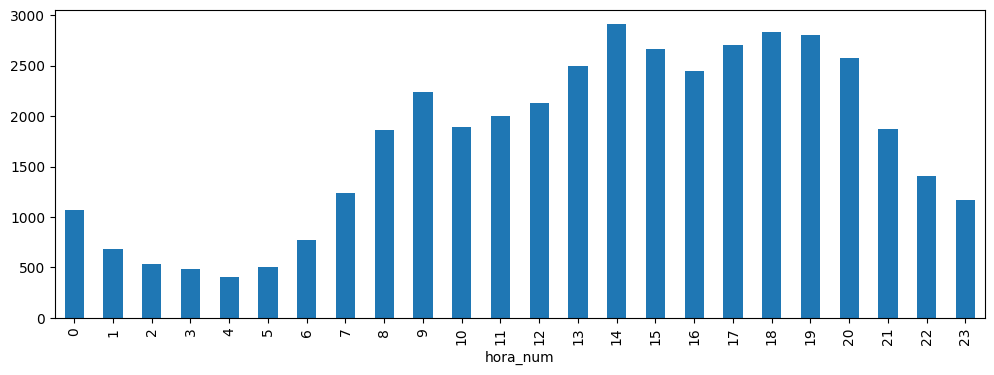

In [20]:
df_accidentes_copy['hora_num'].value_counts().sort_index().plot(kind='bar', figsize=(12,4))

- Franja horaria

In [22]:
df_accidentes_copy['franja'] = pd.cut( df_accidentes_copy['hora_num'], bins=[-1,6,12,18,24], labels=['Madrugada','Mañana','Tarde','Noche'] )

- Accidentes por día de la semana

<Axes: xlabel='dia_semana'>

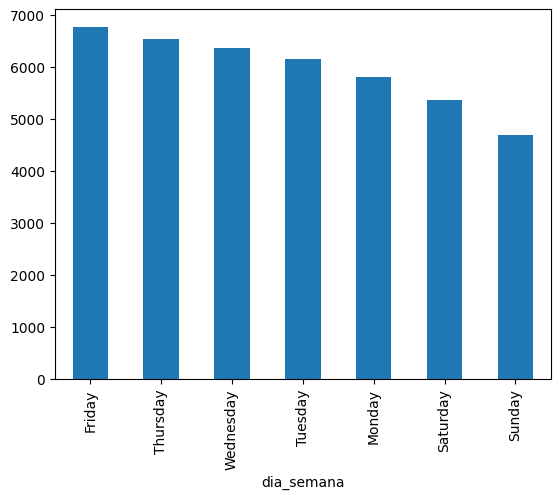

In [23]:
df_accidentes_copy['dia_semana'].value_counts().plot(kind='bar')

### Otras Cosas 

| Columna/Variable    | Descripción |
| ----------------    | ----------- |
| num_expediente      | Indica si el pasajero sobrevivió (1) o no (0) |
| fecha               | Clase del pasaje (1ª, 2ª, 3ª) |
| hora                | Género del pasajero |
| localizacion        | Edad del pasajero |
| numero	          | Es el numero de familiares que viajan con la persona indicada en el manifiesto (lista de pasajeros) |
| cod_distrito        | Número de padres/hijos a bordo |
| distrito            | Tarifa pagada por el pasajero |
| tipo_accidente      | Es la incial de la letra de la ciudad donde embarcó la persona.(C = Cherbourg; Q = Queenstown; S = Southampton) |
| estado_meteorológico| Clase del pasaje como categoría (Primera, Segunda, Tercera) |
| tipo_vehiculo       | Categoría del pasajero (hombre, mujer, niño) |
| tipo_persona        | Booleano que indica si el pasajero es un hombre adulto |
| rango_edad          | Cubierta del barco donde se ubicaba el pasajero |
| sexo	              | Ciudad de embarque: Cherbourg; Queenstown; Southampton)  |
| cod_lesividad       | Indica si el pasajero está vivo ('yes') o muerto ('no') |
| lesividad           | Booleano que indica si el pasajero viajaba solo |
| coordenada_x_utm    | Booleano que indica si el pasajero viajaba solo |
| coordenada_y_utm    | Booleano que indica si el pasajero viajaba solo |
| positiva_alcohol    | Booleano que indica si el pasajero viajaba solo |
| positiva_droga      | Booleano que indica si el pasajero viajaba solo |

In [23]:
df_accidentes[df_accidentes['num_expediente'].duplicated(keep=False)]

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga
0,2025S000056,01/01/2025,0:49:00,CALL. LOPEZ DE HOYOS / CALL. ROS DE OLANO,140,5,CHAMARTÍN,Colisión fronto-lateral,Despejado,Ciclomotor,Conductor,De 30 a 34 años,Hombre,7.0,Asistencia sanitaria sólo en el lugar del acci...,442966.0,4477385.0,N,NaN
1,2025S000056,01/01/2025,0:49:00,CALL. LOPEZ DE HOYOS / CALL. ROS DE OLANO,140,5,CHAMARTÍN,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 40 a 44 años,Hombre,14.0,Sin asistencia sanitaria,442966.0,4477385.0,N,NaN
2,2025S000056,01/01/2025,0:49:00,CALL. LOPEZ DE HOYOS / CALL. ROS DE OLANO,140,5,CHAMARTÍN,Colisión fronto-lateral,Despejado,Turismo,Pasajero,De 40 a 44 años,Mujer,14.0,Sin asistencia sanitaria,442966.0,4477385.0,N,NaN
3,2025S000057,01/01/2025,2:20:00,GTA. RIO ZANCARA / CALL. ARROYO DE POZUELO,1,9,MONCLOA-ARAVACA,Colisión lateral,Despejado,Turismo,Conductor,De 21 a 24 años,Hombre,NaN,NaN,433911.0,4478290.0,N,NaN
4,2025S000057,01/01/2025,2:20:00,GTA. RIO ZANCARA / CALL. ARROYO DE POZUELO,1,9,MONCLOA-ARAVACA,Colisión lateral,Despejado,Turismo,Conductor,De 45 a 49 años,Hombre,NaN,NaN,433911.0,4478290.0,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41724,2025S125384,31/10/2025,21:15:00,PLAZA. INDEPENDENCIA / CALL. ALCALA,1,4,SALAMANCA,Alcance,Nublado,Turismo,Pasajero,De 50 a 54 años,Hombre,14.0,Sin asistencia sanitaria,441509.0,4474600.0,N,NaN
41725,2025S125384,31/10/2025,21:15:00,PLAZA. INDEPENDENCIA / CALL. ALCALA,1,4,SALAMANCA,Alcance,Nublado,Turismo,Pasajero,De 50 a 54 años,Mujer,14.0,Sin asistencia sanitaria,441509.0,4474600.0,N,NaN
41726,2025S125384,31/10/2025,21:15:00,PLAZA. INDEPENDENCIA / CALL. ALCALA,1,4,SALAMANCA,Alcance,Nublado,Turismo,Pasajero,De 70 a 74 años,Hombre,1.0,Atención en urgencias sin posterior ingreso,441509.0,4474600.0,N,NaN
41728,2025S125950,31/10/2025,19:10:00,PLAZA DE CIBELES FRENTE A LA FUENTE,1,3,RETIRO,Colisión lateral,Despejado,Turismo,Conductor,De 40 a 44 años,Hombre,NaN,NaN,441162.0,4474524.0,N,NaN


In [21]:
len(df_accidentes['num_expediente'][df_accidentes['num_expediente'].duplicated()].unique())

14968

In [22]:
df_accidentes['num_expediente'].value_counts().reset_index(name='frecuencia').query("frecuencia < 10")

,num_expediente,frecuencia
30,2025S058437,9
31,2025S009471,9
32,2025S067739,9
33,2025S053198,9
34,2025S049801,9
...,...,...
17706,2025S105856,1
17707,2025S000840,1
17708,2025S000834,1
17709,2025S105976,1


In [24]:
df_accidentes['num_expediente'].dtype

dtype('O')

In [25]:
type(df_accidentes['num_expediente'].iloc[0])

str

In [27]:
df_accidentes_copy["tipo_vehiculo"].unique()

array(['Ciclomotor', 'Turismo', 'Maquinaria de obras',
       'Motocicleta hasta 125cc', 'Furgoneta', 'Bicicleta',
       'Motocicleta > 125cc', 'Todo terreno', 'VMU eléctrico', 'Autobús',
       'Autobús articulado', 'Cuadriciclo no ligero', 'Camión rígido',
       'Vehículo articulado', 'Tractocamión', 'Semiremolque', 'No consta',
       'Bicicleta EPAC (pedaleo asistido)', 'Sin especificar',
       'Cuadriciclo ligero', 'Otros vehículos con motor', 'Autobus EMT',
       'Autocaravana', 'No aplica', 'Patinete no eléctrico',
       'Otros vehículos sin motor', 'Ciclomotor de dos ruedas L1e-B',
       'Caravana', 'Ciclo de motor L1e-A', 'Ambulancia SAMUR',
       'Microbús <= 17 plazas', 'Moto de tres ruedas > 125cc',
       'Tren/metro', 'Ciclo'], dtype=object)

In [28]:
df_accidentes_copy["tipo_accidente"].unique()

array(['Colisión fronto-lateral', 'Colisión lateral',
       'Choque contra obstáculo fijo', 'Alcance', 'Otro', 'Caída',
       'Atropello a persona', 'Colisión múltiple', 'Colisión frontal',
       'Solo salida de la vía', 'Atropello a animal', 'Vuelco',
       'Despeñamiento'], dtype=object)

| Nombre del campo                  | Descripción                                                                 | Tipo de variable | Importancia Inicial | Notas |
|-----------------------------------|----------------------------------------------------------------------------|------------------|---------------------|-------|
| customer                          | ID del cliente                                                             |                  |                     |       |
| state                             | Estados en US                                                              |                  |                     |       |
| customer_lifetime_value           | CLV es el valor económico del cliente para la empresa durante toda su relación |                  |                     |   En dolares    |
| response                          | Respuesta a campañas/llamadas (marketing-engagement)                       |                  |                     |       |
| coverage                          | Tipo de cobertura del cliente                                              |                  |                     |       |
| education                         | Nivel educativo del cliente                                                |                  |                     |       |
| effective_to_date                 | Fecha efectiva                                                             |                  |                     |       |
| employmentstatus                  | Estado laboral del cliente                                                 |                  |                     |       |
| gender                            | Género del cliente                                                         |                  |                     |       |
| income                            | Ingresos del cliente                                                       |                  |                     |       |
| location_code                     | Zona de residencia del cliente                                             |                  |                     |       |
| marital_status                    | Estado Civil del cliente                                                   |                  |                     |       |
| monthly_premium_auto              | Premium mensual                                                            |                  |                     |       |
| months_since_last_claim           | Última reclamación del cliente                                             |                  |                     |       |
| months_since_policy_inception     | Inicio de la póliza                                                        |                  |                     |       |
| number_of_open_complaints         | Reclamaciones abiertas                                                     |                  |                     |  Son partes, no quejas     |
| number_of_policies                | Número de pólizas                                                          |                  |                     |       |
| policy_type                       | Tipo de póliza                                                             |                  |                     |       |
| policy                            | Póliza                                                                     |                  |                     |       |
| renew_offer_type                  | Oferta de renovación                                                       |                  |                     |       |
| sales_channel                     | Canal de ventas (primer contacto compañía-cliente)                         |                  |                     |  Puede continuar en otro canal diferente     |
| total_claim_amount                | Monto de la reclamación                                                    |                  |                     |       |
| vehicle_class                     | Tipo de vehículo                                                           |                  |                     |       |
| vehicle_size                      | Tamaño del vehículo                                                        |                  |                     |       |


In [26]:
pd.set_option('display.max_rows', None) 
pd.set_option('display.max_columns', None)

df_registros=df_accidentes['num_expediente'] .value_counts().reset_index(name='frecuencia').query("frecuencia < 23")
df_registros

,num_expediente,frecuencia
2,2025S109037,22
3,2025S084622,16
4,2025S061539,16
5,2025S075560,16
6,2025S096641,16
7,2025S005288,14
8,2025S021674,13
9,2025S005768,12
10,2025S099406,11
11,2025S105653,11
